# QuadBot — a custom quadruped that learns to walk
### Gymnasium environment · MuJoCo physics · PPO (Stable-Baselines3)

This notebook builds a quadruped robot **from scratch**, wraps it in a **Gymnasium** environment (`QuadBot-v0`), trains a velocity-tracking locomotion policy with **PPO**, evaluates it and analyses its gait, exports it to a torch-free NumPy policy, and renders an MP4.

**Pipeline:** MJCF generator → `QuadBot-v0` → PPO (16 envs + `VecNormalize`) → evaluation → `.npz` policy export → video

| Robot | |
|---|---|
| Degrees of freedom | 12 — abduction, hip, knee on each of 4 legs |
| Mass / standing height | 11.3 kg / 0.30 m |
| Leg segments | thigh 0.20 m, calf 0.20 m, spherical rubber feet |
| Actuation | joint PD servos at 250 Hz, kp = 50 N·m/rad, kd = 1.5 N·m·s/rad, 25–35 N·m torque limits |

| Task: `QuadBot-v0` | |
|---|---|
| Action (12) | joint-angle offsets from the standing pose, ±0.3 rad, at 50 Hz |
| Observation (48) | gravity vector, base linear/angular velocity, command, joint positions/velocities, previous action (body frame) |
| Command | forward speed 0.3–1.0 m/s and yaw rate ±0.6 rad/s, resampled every 10 s |
| Reward | velocity tracking + regularisers: orientation, height, torque, smoothness, foot air-time, foot slip, collisions, joint limits |
| Episode | 20 s; terminates if the torso touches the ground, drops below 0.16 m, or tilts past 60° |

**Runtime.** A normal **CPU runtime is enough** — this MLP policy trains faster on CPU than on a GPU. The full 8 M-step run takes roughly **an hour** on Colab. Set `QUICK_RUN = True` in Section 6 for a ~2-minute smoke test, or skip to **Section 11** to load the pretrained policy (`quadbot_policy.npz`) that comes with this notebook.

## 1 · Setup
Installs the packages and picks a headless OpenGL backend for MuJoCo (NVIDIA EGL on GPU runtimes, Mesa EGL or OSMesa on CPU runtimes). `MUJOCO_GL` must be set before MuJoCo is imported, so run this cell first.

In [1]:
# @title Install dependencies and configure headless rendering
import importlib.util
import json
import os
import shutil
import subprocess
import sys

IN_COLAB = "google.colab" in sys.modules
PROJECT_DIR = "/content/quadbot_project" if IN_COLAB else os.path.abspath("quadbot_project")
os.makedirs(os.path.join(PROJECT_DIR, "quadbot"), exist_ok=True)
os.chdir(PROJECT_DIR)
if PROJECT_DIR not in sys.path:
    sys.path.insert(0, PROJECT_DIR)

REQUIRED = {  # import name -> pip requirement
    "mujoco": "mujoco>=3.2",
    "gymnasium": "gymnasium>=1.0",
    "stable_baselines3": "stable-baselines3>=2.4",
    "imageio_ffmpeg": "imageio[ffmpeg]",
    "tensorboard": "tensorboard",
    "pandas": "pandas",
}
missing = [req for mod, req in REQUIRED.items() if importlib.util.find_spec(mod) is None]
if missing:
    print("Installing:", ", ".join(missing))
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", *missing])

PROBE = (
    "import mujoco\n"
    "m = mujoco.MjModel.from_xml_string('<mujoco><worldbody><light pos=\"0 0 1\"/><geom size=\".1\"/></worldbody></mujoco>')\n"
    "r = mujoco.Renderer(m, 32, 32); r.update_scene(mujoco.MjData(m)); r.render(); print('RENDER_OK')"
)


def render_backend_works(backend: str) -> bool:
    env = dict(os.environ, MUJOCO_GL=backend, PYOPENGL_PLATFORM=backend)
    try:
        out = subprocess.run([sys.executable, "-c", PROBE], env=env, capture_output=True, text=True, timeout=180)
    except subprocess.TimeoutExpired:
        return False
    return "RENDER_OK" in out.stdout


if shutil.which("nvidia-smi") and subprocess.run(["nvidia-smi"], capture_output=True).returncode == 0:
    # Colab installs the NVIDIA driver without the EGL vendor file that glvnd needs.
    icd = "/usr/share/glvnd/egl_vendor.d/10_nvidia.json"
    if not os.path.exists(icd) and os.access(os.path.dirname(icd) or "/", os.W_OK):
        with open(icd, "w") as f:
            json.dump({"file_format_version": "1.0.0", "ICD": {"library_path": "libEGL_nvidia.so.0"}}, f)

MUJOCO_BACKEND = "egl" if render_backend_works("egl") else None
if MUJOCO_BACKEND is None and shutil.which("apt-get"):
    print("EGL unavailable -> installing OSMesa (software rendering)...")
    subprocess.run("apt-get -qq update && apt-get -qq install -y libosmesa6-dev > /dev/null", shell=True)
    MUJOCO_BACKEND = "osmesa" if render_backend_works("osmesa") else None
if MUJOCO_BACKEND is None:
    raise RuntimeError("No headless OpenGL backend found; install libegl1 or libosmesa6.")
os.environ["MUJOCO_GL"] = MUJOCO_BACKEND
os.environ["PYOPENGL_PLATFORM"] = MUJOCO_BACKEND
print(f"Rendering backend: {MUJOCO_BACKEND} | CPU cores: {os.cpu_count()} | project dir: {PROJECT_DIR}")

Installing: mujoco>=3.2, stable-baselines3>=2.4
Rendering backend: egl | CPU cores: 2 | project dir: /content/quadbot_project


## 2 · The robot (MJCF generator)
The robot is described by a `RobotSpec` dataclass and turned into MJCF by `build_quadbot_xml()`. Generating the XML keeps the four legs consistent and makes design studies easy (change a leg length or motor gain in Python and rebuild).

* **Kinematics per leg:** torso → *abad* (x-axis) → hip link → *hip* (y-axis) → thigh → *knee* (y-axis) → calf → foot.
* **Collisions:** robot geoms only collide with the ground (never with each other); decorative geoms are visual-only and massless.
* **Motors:** MuJoCo `<position>` actuators = joint-level PD loops with torque limits, integrated implicitly for stability.
* **Sensors:** a touch sensor on each foot (used for the gait reward and the video HUD).

The package is written to disk with `%%writefile` so that worker processes (used automatically on machines with ≥ 4 cores) can import it.

In [2]:
%%writefile quadbot/robot.py
"""QuadBot: a custom 12-DoF quadruped described in MJCF.

The model is generated from a :class:`RobotSpec` so that leg geometry, mass
distribution and motor parameters can be changed from Python (useful for
design studies and domain randomisation) without hand-editing four copies of
the same leg in XML.

Kinematic layout (per leg, all legs identical, mirrored left/right):

    torso --[abad: x-axis]--> hip link --[hip: y-axis]--> thigh
          --[knee: y-axis]--> calf --> foot (sphere, the only intended contact)

Leg order everywhere in this project: FL, FR, RL, RR.
Joint order per leg: abad, hip, knee.
"""
from __future__ import annotations

from dataclasses import dataclass

LEG_NAMES: tuple[str, ...] = ("FL", "FR", "RL", "RR")
JOINT_SUFFIXES: tuple[str, ...] = ("abad", "hip", "knee")
JOINT_NAMES: tuple[str, ...] = tuple(f"{leg}_{j}" for leg in LEG_NAMES for j in JOINT_SUFFIXES)
FOOT_GEOM_NAMES: tuple[str, ...] = tuple(f"{leg}_foot" for leg in LEG_NAMES)


@dataclass(frozen=True)
class RobotSpec:
    """Physical parameters of QuadBot (SI units, radians)."""

    # Torso (full box dimensions) and mass.
    torso_size: tuple[float, float, float] = (0.38, 0.18, 0.09)
    torso_mass: float = 5.5
    # Abduction-axis position relative to the torso centre (x forward, y left).
    hip_offset_x: float = 0.18
    hip_offset_y: float = 0.055
    # Lateral offset from the abduction axis to the thigh (hip pitch) joint.
    hip_link_length: float = 0.07
    thigh_length: float = 0.20
    calf_length: float = 0.20
    foot_radius: float = 0.022
    hip_mass: float = 0.55
    thigh_mass: float = 0.70
    calf_mass: float = 0.16
    foot_mass: float = 0.04
    # Joint limits.
    abad_range: tuple[float, float] = (-0.80, 0.80)
    hip_range: tuple[float, float] = (-1.00, 2.60)
    knee_range: tuple[float, float] = (-2.70, -0.70)
    # Motors: joint-level PD servo (MuJoCo <position> actuator).
    kp: float = 50.0
    kd: float = 1.5
    abad_torque_limit: float = 25.0
    hip_torque_limit: float = 25.0
    knee_torque_limit: float = 35.0
    joint_armature: float = 0.012  # reflected rotor inertia
    joint_damping: float = 0.05
    joint_frictionloss: float = 0.05
    foot_friction: float = 1.0
    # Nominal standing posture per leg: (abad, hip, knee).
    default_joint_angles: tuple[float, float, float] = (0.0, 0.8, -1.5)

    @property
    def total_mass(self) -> float:
        per_leg = self.hip_mass + self.thigh_mass + self.calf_mass + self.foot_mass
        return self.torso_mass + 4.0 * per_leg

    @property
    def nominal_height(self) -> float:
        """Torso-centre height when standing in the default posture."""
        import math

        _, q_hip, q_knee = self.default_joint_angles
        return (
            self.thigh_length * math.cos(q_hip)
            + self.calf_length * math.cos(q_hip + q_knee)
            + self.foot_radius
        )


_LEG_TEMPLATE = """
      <body name="{leg}_hip" pos="{hx:.4f} {hy:.4f} 0">
        <joint name="{leg}_abad" class="abad"/>
        <geom class="visual" type="cylinder" size="0.042 0.030" pos="0 0 0" euler="0 1.5708 0" material="motor"/>
        <geom class="collision" type="cylinder" size="0.040 0.028" pos="0 {ly_half:.4f} 0" euler="1.5708 0 0" mass="{hip_mass:.4f}"/>
        <geom class="visual" type="cylinder" size="0.040 0.028" pos="0 {ly_half:.4f} 0" euler="1.5708 0 0" material="accent"/>
        <body name="{leg}_thigh" pos="0 {ly:.4f} 0">
          <joint name="{leg}_hip" class="hip"/>
          <geom class="collision" type="capsule" fromto="0 0 0 0 0 {thigh_end:.4f}" size="0.022" mass="{thigh_mass:.4f}"/>
          <geom class="visual" type="capsule" fromto="0 0 0 0 0 {thigh_end:.4f}" size="0.024" material="limb"/>
          <geom class="visual" type="cylinder" size="0.036 0.022" euler="1.5708 0 0" material="motor"/>
          <body name="{leg}_calf" pos="0 0 {thigh_end:.4f}">
            <joint name="{leg}_knee" class="knee"/>
            <geom class="visual" type="cylinder" size="0.026 0.020" euler="1.5708 0 0" material="accent"/>
            <geom class="collision" type="capsule" fromto="0 0 0 0 0 {calf_geom_end:.4f}" size="0.014" mass="{calf_mass:.4f}"/>
            <geom class="visual" type="capsule" fromto="0 0 0 0 0 {calf_geom_end:.4f}" size="0.015" material="limb_dark"/>
            <geom name="{leg}_foot" class="foot" pos="0 0 {calf_end:.4f}" size="{foot_r:.4f}" mass="{foot_mass:.4f}"/>
            <site name="{leg}_foot_site" pos="0 0 {calf_end:.4f}" size="{site_r:.4f}" rgba="0 0 0 0"/>
          </body>
        </body>
      </body>"""


def _leg_xml(spec: RobotSpec, leg: str) -> str:
    sx = 1.0 if leg[0] == "F" else -1.0
    sy = 1.0 if leg[1] == "L" else -1.0
    return _LEG_TEMPLATE.format(
        leg=leg,
        hx=sx * spec.hip_offset_x,
        hy=sy * spec.hip_offset_y,
        ly=sy * spec.hip_link_length,
        ly_half=sy * 0.5 * spec.hip_link_length,
        hip_mass=spec.hip_mass,
        thigh_mass=spec.thigh_mass,
        calf_mass=spec.calf_mass,
        foot_mass=spec.foot_mass,
        thigh_end=-spec.thigh_length,
        calf_end=-spec.calf_length,
        calf_geom_end=-(spec.calf_length - spec.foot_radius),
        foot_r=spec.foot_radius,
        site_r=spec.foot_radius * 1.25,
    )


def build_quadbot_xml(spec: RobotSpec | None = None, sim_timestep: float = 0.004) -> str:
    """Return a complete MJCF document (robot + flat ground + lights)."""
    s = spec or RobotSpec()
    tx, ty, tz = (0.5 * v for v in s.torso_size)
    legs = "".join(_leg_xml(s, leg) for leg in LEG_NAMES)
    actuators = []
    for leg in LEG_NAMES:
        for joint, limit in zip(
            JOINT_SUFFIXES, (s.abad_torque_limit, s.hip_torque_limit, s.knee_torque_limit)
        ):
            lo, hi = getattr(s, f"{joint}_range")
            actuators.append(
                f'    <position name="{leg}_{joint}_servo" joint="{leg}_{joint}" kp="{s.kp}" '
                f'kv="{s.kd}" ctrlrange="{lo} {hi}" forcerange="{-limit} {limit}"/>'
            )
    touch = "\n".join(
        f'    <touch name="{leg}_touch" site="{leg}_foot_site"/>' for leg in LEG_NAMES
    )
    spawn_z = s.nominal_height + 0.02

    return f"""<mujoco model="quadbot">
  <compiler angle="radian" autolimits="true"/>
  <option timestep="{sim_timestep}" integrator="implicitfast" iterations="10" ls_iterations="10"/>

  <visual>
    <global offwidth="1920" offheight="1080" azimuth="135" elevation="-20"/>
    <quality shadowsize="4096" offsamples="4"/>
    <headlight ambient="0.35 0.35 0.35" diffuse="0.55 0.55 0.55" specular="0.1 0.1 0.1"/>
    <rgba haze="0.15 0.25 0.35 1"/>
    <map znear="0.01" zfar="60"/>
  </visual>

  <default>
    <geom density="0"/>
    <default class="quadbot">
      <joint damping="{s.joint_damping}" armature="{s.joint_armature}" frictionloss="{s.joint_frictionloss}"/>
      <default class="abad"><joint axis="1 0 0" range="{s.abad_range[0]} {s.abad_range[1]}"/></default>
      <default class="hip"><joint axis="0 1 0" range="{s.hip_range[0]} {s.hip_range[1]}"/></default>
      <default class="knee"><joint axis="0 1 0" range="{s.knee_range[0]} {s.knee_range[1]}"/></default>
      <default class="visual"><geom contype="0" conaffinity="0" group="2"/></default>
      <!-- Robot collision geoms only collide with the environment, never with each other. -->
      <default class="collision"><geom contype="1" conaffinity="0" group="3" rgba="0.8 0.2 0.2 0.3"/></default>
      <default class="foot">
        <geom type="sphere" contype="1" conaffinity="0" group="2" condim="3"
              friction="{s.foot_friction} 0.02 0.01" material="rubber"/>
      </default>
    </default>
  </default>

  <asset>
    <texture type="skybox" builtin="gradient" rgb1="0.42 0.60 0.80" rgb2="0.05 0.08 0.14" width="512" height="3072"/>
    <texture name="grid" type="2d" builtin="checker" rgb1="0.20 0.24 0.29" rgb2="0.13 0.16 0.20"
             mark="edge" markrgb="0.45 0.55 0.65" width="512" height="512"/>
    <material name="grid" texture="grid" texrepeat="2 2" texuniform="true" reflectance="0.08"/>
    <material name="body" rgba="0.16 0.17 0.20 1" specular="0.4" shininess="0.6"/>
    <material name="shell" rgba="0.96 0.52 0.12 1" specular="0.5" shininess="0.7"/>
    <material name="accent" rgba="0.96 0.52 0.12 1" specular="0.5" shininess="0.6"/>
    <material name="motor" rgba="0.30 0.32 0.36 1" specular="0.6" shininess="0.8"/>
    <material name="limb" rgba="0.82 0.84 0.87 1" specular="0.4" shininess="0.5"/>
    <material name="limb_dark" rgba="0.22 0.23 0.26 1" specular="0.3" shininess="0.4"/>
    <material name="rubber" rgba="0.06 0.06 0.07 1" specular="0.1"/>
    <material name="lens" rgba="0.10 0.85 1.00 1" emission="0.9"/>
  </asset>

  <worldbody>
    <light name="fill" directional="true" pos="0 0 6" dir="0.4 -0.3 -1" diffuse="0.22 0.22 0.25" castshadow="false"/>
    <geom name="floor" type="plane" size="0 0 0.05" material="grid" contype="0" conaffinity="1" condim="3"/>

    <body name="torso" pos="0 0 {spawn_z:.4f}" childclass="quadbot">
      <freejoint name="root"/>
      <!-- Key light follows the robot so its shadow stays sharp wherever it walks. -->
      <light name="sun" mode="trackcom" directional="true" pos="-0.6 0.8 2.5" dir="0.24 -0.32 -1"
             diffuse="0.72 0.72 0.68" specular="0.2 0.2 0.2" castshadow="true"/>
      <camera name="side" mode="trackcom" pos="0 -1.4 0.35" xyaxes="1 0 0 0 0.25 1"/>
      <site name="imu" pos="0 0 0" size="0.01" rgba="0 0 0 0"/>
      <geom name="torso" class="collision" type="box" size="{tx:.4f} {ty:.4f} {tz:.4f}" mass="{s.torso_mass}"/>
      <geom class="visual" type="box" size="{tx:.4f} {ty:.4f} {tz:.4f}" material="body"/>
      <geom class="visual" type="box" size="{tx * 0.82:.4f} {ty * 0.86:.4f} 0.008" pos="0 0 {tz + 0.006:.4f}" material="shell"/>
      <geom class="visual" type="box" size="{tx * 0.40:.4f} {ty * 0.50:.4f} 0.014" pos="{-tx * 0.25:.4f} 0 {tz + 0.024:.4f}" material="motor"/>
      <!-- Sensor head -->
      <geom class="visual" type="box" size="0.035 {ty * 0.72:.4f} {tz * 0.62:.4f}" pos="{tx + 0.025:.4f} 0 0.008" material="limb_dark"/>
      <geom class="visual" type="cylinder" size="0.013 0.006" pos="{tx + 0.061:.4f} 0.032 0.012" euler="0 1.5708 0" material="lens"/>
      <geom class="visual" type="cylinder" size="0.013 0.006" pos="{tx + 0.061:.4f} -0.032 0.012" euler="0 1.5708 0" material="lens"/>
{legs}
    </body>
  </worldbody>

  <actuator>
{chr(10).join(actuators)}
  </actuator>

  <sensor>
{touch}
  </sensor>
</mujoco>
"""


if __name__ == "__main__":  # pragma: no cover - manual inspection helper
    import mujoco

    spec = RobotSpec()
    model = mujoco.MjModel.from_xml_string(build_quadbot_xml(spec))
    print(f"nq={model.nq} nv={model.nv} nu={model.nu} nbody={model.nbody}")
    print(f"total mass (spec) = {spec.total_mass:.2f} kg, model = {sum(model.body_mass):.2f} kg")
    print(f"nominal height = {spec.nominal_height:.3f} m")

Writing quadbot/robot.py


## 3 · The Gymnasium environment
`QuadBotEnv` subclasses `gymnasium.Env` directly (no dependence on Gymnasium's internal MuJoCo base class), so it is stable across Gymnasium versions. Highlights:

* **Observation (48-D, body frame):** projected gravity, base linear velocity (privileged in simulation — swap for a state estimator on hardware via `include_base_lin_vel=False`), base angular velocity, command, joint positions relative to the standing pose, joint velocities, previous action.
* **Reward (`DEFAULT_REWARD_SCALES`):** exponential velocity-tracking kernels plus legged-gym-style regularisers. The per-step total is clipped at zero (`only_positive_rewards`) so penalties never make early termination attractive.
* **Domain randomisation (optional):** ground/foot friction, payload mass, motor strength and random pushes — the usual ingredients for sim-to-real transfer.
* `info` contains only floats (cheap to copy in vectorised envs); foot contacts are exposed as `env.unwrapped.foot_contacts`.

In [3]:
%%writefile quadbot/env.py
"""Gymnasium environment: QuadBot learns to walk by tracking velocity commands.

MDP summary
-----------
* Action (12,): joint-position offsets in [-1, 1], scaled by ``action_scale``
  and added to the nominal standing pose. Low-level PD servos run at 250 Hz,
  the policy at 50 Hz.
* Observation (48,): projected gravity (3), base linear velocity (3), base
  angular velocity (3), command (3), joint positions relative to the nominal
  pose (12), joint velocities (12), previous action (12). All in the body frame.
* Reward: legged_gym-style sum of a velocity-tracking term and regularisers
  (see ``DEFAULT_REWARD_SCALES``), optionally clipped at zero.
* Termination: torso touches the ground, torso too low, or tilt > 60 deg.
* Truncation: handled by the ``TimeLimit`` wrapper added at registration.
"""
from __future__ import annotations

import math
from dataclasses import dataclass, field, replace
from typing import Any

import gymnasium as gym
import mujoco
import numpy as np
from gymnasium import spaces
from gymnasium.utils import EzPickle

from .robot import FOOT_GEOM_NAMES, JOINT_NAMES, LEG_NAMES, RobotSpec, build_quadbot_xml

DEFAULT_REWARD_SCALES: dict[str, float] = {
    "tracking_lin_vel": 1.5,
    "tracking_ang_vel": 0.5,
    "lin_vel_z": -2.0,
    "ang_vel_xy": -0.05,
    "orientation": -5.0,
    "base_height": -30.0,
    "torques": -1e-4,
    "dof_acc": -2.5e-7,
    "action_rate": -0.01,
    "feet_air_time": 1.0,
    "feet_slip": -0.1,
    "collision": -1.0,
    "dof_pos_limits": -10.0,
    "abad_deviation": -0.5,
}


@dataclass
class QuadBotEnvConfig:
    """Everything that defines the task. Defaults reproduce the reference run."""

    robot: RobotSpec = field(default_factory=RobotSpec)
    # Simulation / control
    sim_timestep: float = 0.004  # 250 Hz physics
    frame_skip: int = 5  # 50 Hz policy
    action_scale: float = 0.3  # rad per unit action
    # Commands: (vx [m/s], vy [m/s], yaw rate [rad/s]) sampled uniformly
    command_vx_range: tuple[float, float] = (0.3, 1.0)
    command_vy_range: tuple[float, float] = (0.0, 0.0)
    command_yaw_range: tuple[float, float] = (0.0, 0.0)
    command_resample_seconds: float = 10.0
    # Observations
    include_base_lin_vel: bool = True  # privileged in sim; replace with an estimator on hardware
    obs_noise_scale: float = 0.0  # 0 disables observation noise
    # Termination
    min_base_height: float = 0.16
    min_uprightness: float = 0.5  # cos(max tilt); 0.5 -> 60 degrees
    # Reset distribution
    reset_joint_noise: float = 0.1
    reset_base_vel_noise: float = 0.1
    # Domain randomisation (all off by default)
    domain_randomization: bool = False
    friction_range: tuple[float, float] = (0.5, 1.25)
    payload_range: tuple[float, float] = (-0.5, 1.5)  # kg added to torso
    motor_strength_range: tuple[float, float] = (0.9, 1.1)
    push_interval_seconds: float = 8.0
    push_max_velocity: float = 0.4
    # Reward
    reward_scales: dict[str, float] = field(default_factory=lambda: dict(DEFAULT_REWARD_SCALES))
    tracking_sigma: float = 0.25
    base_height_target: float = 0.30
    feet_air_time_target: float = 0.30
    soft_dof_pos_limit: float = 0.95  # fraction of joint range before penalty
    only_positive_rewards: bool = True
    # Rendering
    render_width: int = 640
    render_height: int = 480
    camera_distance: float = 1.6
    camera_azimuth: float = 140.0
    camera_elevation: float = -15.0

    @property
    def control_dt(self) -> float:
        return self.sim_timestep * self.frame_skip


# Observation scaling (matches common legged-robot practice).
_LIN_VEL_SCALE = 2.0
_ANG_VEL_SCALE = 0.25
_DOF_VEL_SCALE = 0.05
_COMMAND_SCALE = np.array([2.0, 2.0, 0.25])


class QuadBotEnv(gym.Env, EzPickle):
    """Velocity-command locomotion for the custom QuadBot quadruped."""

    metadata = {"render_modes": ["rgb_array", "human"], "render_fps": 50}

    def __init__(
        self,
        render_mode: str | None = None,
        config: QuadBotEnvConfig | None = None,
        **config_overrides: Any,
    ) -> None:
        EzPickle.__init__(self, render_mode, config, **config_overrides)
        cfg = config or QuadBotEnvConfig()
        if config_overrides:
            cfg = replace(cfg, **config_overrides)
        self.cfg = cfg
        if render_mode is not None and render_mode not in self.metadata["render_modes"]:
            raise ValueError(f"Unsupported render_mode {render_mode!r}")
        self.render_mode = render_mode

        self.model = mujoco.MjModel.from_xml_string(
            build_quadbot_xml(cfg.robot, sim_timestep=cfg.sim_timestep)
        )
        self.data = mujoco.MjData(self.model)
        self.frame_skip = int(cfg.frame_skip)
        self.dt = cfg.control_dt
        self.metadata = {**self.metadata, "render_fps": int(round(1.0 / self.dt))}

        m = self.model
        self._torso_id = m.body("torso").id
        self._torso_geom = m.geom("torso").id
        self._floor_geom = m.geom("floor").id
        self._foot_geoms = np.array([m.geom(n).id for n in FOOT_GEOM_NAMES])
        self._non_foot_lut = np.ones(m.ngeom, dtype=bool)
        self._non_foot_lut[self._foot_geoms] = False
        self._foot_sites = np.array([m.site(f"{leg}_foot_site").id for leg in LEG_NAMES])
        self._touch_adr = np.array(
            [m.sensor_adr[m.sensor(f"{leg}_touch").id] for leg in LEG_NAMES]
        )
        qpos_adr = np.array([m.jnt_qposadr[m.joint(n).id] for n in JOINT_NAMES])
        qvel_adr = np.array([m.jnt_dofadr[m.joint(n).id] for n in JOINT_NAMES])
        # The generator emits joints contiguously; slices are faster than fancy indexing.
        assert np.all(np.diff(qpos_adr) == 1) and np.all(np.diff(qvel_adr) == 1)
        self._qs = slice(int(qpos_adr[0]), int(qpos_adr[-1]) + 1)
        self._vs = slice(int(qvel_adr[0]), int(qvel_adr[-1]) + 1)
        self._abad_idx = np.arange(0, 12, 3)

        self.default_joint_pos = np.tile(np.asarray(cfg.robot.default_joint_angles, float), 4)
        self._ctrl_lo = m.actuator_ctrlrange[:, 0].copy()
        self._ctrl_hi = m.actuator_ctrlrange[:, 1].copy()
        jnt_range = m.jnt_range[[m.joint(n).id for n in JOINT_NAMES]]
        mid, half = jnt_range.mean(axis=1), 0.5 * (jnt_range[:, 1] - jnt_range[:, 0])
        self._soft_lo = mid - cfg.soft_dof_pos_limit * half
        self._soft_hi = mid + cfg.soft_dof_pos_limit * half

        # Nominal values used by domain randomisation.
        self._nominal_torso_mass = float(m.body_mass[self._torso_id])
        self._nominal_gain = m.actuator_gainprm[:, 0].copy()
        self._nominal_bias = m.actuator_biasprm[:, :3].copy()
        self._friction_geoms = np.concatenate([[self._floor_geom], self._foot_geoms])
        self._nominal_friction = m.geom_friction[self._friction_geoms, 0].copy()

        self._max_steps_per_command = max(1, int(round(cfg.command_resample_seconds / self.dt)))
        self._push_every = (
            int(round(cfg.push_interval_seconds / self.dt)) if cfg.push_interval_seconds > 0 else 0
        )
        self._reward_terms = {k: v for k, v in cfg.reward_scales.items() if v != 0.0}

        self.action_space = spaces.Box(-1.0, 1.0, shape=(12,), dtype=np.float32)
        obs_dim = 45 + (3 if cfg.include_base_lin_vel else 0)
        self.observation_space = spaces.Box(-np.inf, np.inf, shape=(obs_dim,), dtype=np.float32)

        # Runtime state (initialised in reset).
        self.command = np.zeros(3)
        self._fixed_command: np.ndarray | None = None
        self._last_action = np.zeros(12)
        self._last_dof_vel = np.zeros(12)
        self._feet_air_time = np.zeros(4)
        self._last_contacts = np.zeros(4, dtype=bool)
        self._last_foot_pos = np.zeros((4, 3))
        self.foot_contacts = np.zeros(4, dtype=bool)
        self._step_count = 0
        self._episode_sums: dict[str, float] = {}
        self._renderer: mujoco.Renderer | None = None
        self._camera: mujoco.MjvCamera | None = None
        self._viewer = None
        # Optional hook f(env) called after every physics step (used for slow-motion video).
        self.substep_callback = None

    # ------------------------------------------------------------------ API
    def reset(self, *, seed: int | None = None, options: dict[str, Any] | None = None):
        super().reset(seed=seed)
        options = options or {}
        m, d, rng, cfg = self.model, self.data, self.np_random, self.cfg
        mujoco.mj_resetData(m, d)

        if cfg.domain_randomization:
            self._randomize_dynamics()

        d.qpos[0:3] = (0.0, 0.0, cfg.robot.nominal_height + 0.01)
        d.qpos[3:7] = (1.0, 0.0, 0.0, 0.0)
        d.qpos[self._qs] = self.default_joint_pos + rng.uniform(
            -cfg.reset_joint_noise, cfg.reset_joint_noise, 12
        )
        d.qvel[0:6] = rng.uniform(-cfg.reset_base_vel_noise, cfg.reset_base_vel_noise, 6)
        d.ctrl[:] = self.default_joint_pos
        mujoco.mj_forward(m, d)

        fixed = options.get("command")
        self._fixed_command = None if fixed is None else np.asarray(fixed, dtype=float).copy()
        self._resample_command()
        self._last_action[:] = 0.0
        self._last_dof_vel[:] = d.qvel[self._vs]
        self._feet_air_time[:] = 0.0
        self._last_contacts[:] = False
        self._last_foot_pos[:] = d.site_xpos[self._foot_sites]
        self._step_count = 0
        self._episode_sums = {k: 0.0 for k in self._reward_terms}

        obs = self._get_obs(self._base_state())
        if self.render_mode == "human":
            self.render()
        self.foot_contacts = np.zeros(4, dtype=bool)
        return obs, {"command_vx": float(self.command[0]), "command_yaw": float(self.command[2])}

    def step(self, action: np.ndarray):
        m, d, cfg = self.model, self.data, self.cfg
        action = np.clip(np.asarray(action, dtype=float), -1.0, 1.0)
        np.clip(
            self.default_joint_pos + cfg.action_scale * action, self._ctrl_lo, self._ctrl_hi, out=d.ctrl
        )
        if cfg.domain_randomization and self._push_every and self._step_count % self._push_every == 0 and self._step_count > 0:
            d.qvel[0:2] += self.np_random.uniform(-cfg.push_max_velocity, cfg.push_max_velocity, 2)

        if self.substep_callback is None:
            mujoco.mj_step(m, d, nstep=self.frame_skip)
        else:  # identical physics, one step at a time
            for _ in range(self.frame_skip):
                mujoco.mj_step(m, d)
                self.substep_callback(self)
        self._step_count += 1

        state = self._base_state()
        contacts, collisions, torso_contact = self._contact_state()
        terms = self._compute_reward_terms(state, action, contacts, collisions)

        reward = 0.0
        for name, scale in self._reward_terms.items():
            value = scale * terms[name]
            self._episode_sums[name] += value
            reward += value
        if cfg.only_positive_rewards:
            reward = max(reward, 0.0)

        proj_g, height = state[3], state[4]
        terminated = bool(
            torso_contact or height < cfg.min_base_height or -proj_g[2] < cfg.min_uprightness
        )

        self._last_action[:] = action
        if self._step_count % self._max_steps_per_command == 0:
            self._resample_command()

        obs = self._get_obs(state)
        self.foot_contacts = contacts
        info = {
            "x_velocity": float(state[1][0]),
            "y_velocity": float(state[1][1]),
            "yaw_rate": float(state[2][2]),
            "base_height": height,
            "command_vx": float(self.command[0]),
            "command_yaw": float(self.command[2]),
            "x_position": float(d.qpos[0]),
        }
        if terminated:
            info["episode_reward_terms"] = dict(self._episode_sums)
        if self.render_mode == "human":
            self.render()
        return obs, float(reward), terminated, False, info

    def render(self):
        if self.render_mode is None:
            gym.logger.warn("render() called without render_mode; pass render_mode='rgb_array'.")
            return None
        if self.render_mode == "human":
            return self._render_human()
        return self.render_frame()

    def render_frame(self, width: int | None = None, height: int | None = None) -> np.ndarray:
        """Render an RGB frame from a camera that follows the robot."""
        w = width or self.cfg.render_width
        h = height or self.cfg.render_height
        if self._renderer is None or (self._renderer.width, self._renderer.height) != (w, h):
            if self._renderer is not None:
                self._renderer.close()
            self._renderer = mujoco.Renderer(self.model, height=h, width=w)
            self._camera = mujoco.MjvCamera()
            self._camera.type = mujoco.mjtCamera.mjCAMERA_FREE
            self._camera.distance = self.cfg.camera_distance
            self._camera.azimuth = self.cfg.camera_azimuth
            self._camera.elevation = self.cfg.camera_elevation
            self._camera.lookat[:] = self.data.xpos[self._torso_id]
        torso = self.data.xpos[self._torso_id]
        # Critically-damped follow keeps the video smooth while staying on the robot.
        self._camera.lookat[:2] += 0.25 * (torso[:2] - self._camera.lookat[:2])
        self._camera.lookat[2] = 0.22
        self._renderer.update_scene(self.data, camera=self._camera)
        return self._renderer.render()

    def close(self) -> None:
        if self._renderer is not None:
            self._renderer.close()
            self._renderer = None
        if self._viewer is not None:
            self._viewer.close()
            self._viewer = None

    # ------------------------------------------------------------ helpers
    def set_command(self, vx: float, vy: float = 0.0, yaw_rate: float = 0.0) -> None:
        """Pin the command (e.g. for evaluation or teleoperation)."""
        self._fixed_command = np.array([vx, vy, yaw_rate], dtype=float)
        self.command[:] = self._fixed_command

    def _resample_command(self) -> None:
        if self._fixed_command is not None:
            self.command[:] = self._fixed_command
            return
        cfg, rng = self.cfg, self.np_random
        self.command[:] = (
            rng.uniform(*cfg.command_vx_range),
            rng.uniform(*cfg.command_vy_range),
            rng.uniform(*cfg.command_yaw_range),
        )

    def _randomize_dynamics(self) -> None:
        m, rng, cfg = self.model, self.np_random, self.cfg
        m.geom_friction[self._friction_geoms, 0] = rng.uniform(*cfg.friction_range)
        m.body_mass[self._torso_id] = self._nominal_torso_mass + rng.uniform(*cfg.payload_range)
        strength = rng.uniform(*cfg.motor_strength_range, size=m.nu)
        m.actuator_gainprm[:, 0] = self._nominal_gain * strength
        m.actuator_biasprm[:, 1] = self._nominal_bias[:, 1] * strength
        mujoco.mj_setConst(m, self.data)

    def _base_state(self):
        d = self.data
        rot = d.xmat[self._torso_id].reshape(3, 3)  # world_R_body
        lin_vel_b = rot.T @ d.qvel[0:3]
        ang_vel_b = d.qvel[3:6].copy()  # free-joint angular velocity is already in body frame
        proj_g = -rot[2, :].copy()  # gravity direction expressed in the body frame
        return rot, lin_vel_b, ang_vel_b, proj_g, float(d.qpos[2])

    def _contact_state(self):
        d = self.data
        contacts = d.sensordata[self._touch_adr] > 1.0
        ncon = d.ncon
        if ncon == 0:
            return contacts, 0, False
        geoms = d.contact.geom[:ncon]
        # Robot geoms never collide with each other, so every contact involves the floor.
        robot_geoms = geoms[:, 0] + geoms[:, 1] - self._floor_geom
        collisions = int(np.count_nonzero(self._non_foot_lut[robot_geoms]))
        torso_contact = bool((robot_geoms == self._torso_geom).any())
        return contacts, collisions, torso_contact

    def _compute_reward_terms(self, state, action, contacts, collisions) -> dict[str, float]:
        cfg, d, dt = self.cfg, self.data, self.dt
        _, v, w, g, height = state
        q = d.qpos[self._qs]
        qd = d.qvel[self._vs]
        cmd = self.command

        lin_err = (cmd[0] - v[0]) ** 2 + (cmd[1] - v[1]) ** 2
        ang_err = (cmd[2] - w[2]) ** 2

        # Feet air time (legged_gym): reward steps that land after a long swing.
        contact_filt = contacts | self._last_contacts
        self._last_contacts[:] = contacts
        first_contact = (self._feet_air_time > 0.0) & contact_filt
        self._feet_air_time += dt
        if math.hypot(cmd[0], cmd[1]) > 0.1:
            air_time_reward = float((self._feet_air_time - cfg.feet_air_time_target) @ first_contact)
        else:
            air_time_reward = 0.0
        self._feet_air_time *= ~contact_filt

        foot_xy = d.site_xpos[self._foot_sites, :2]
        foot_vel = (foot_xy - self._last_foot_pos[:, :2]) / dt
        self._last_foot_pos[:, :2] = foot_xy
        slip = float(np.einsum("ij,ij->i", foot_vel, foot_vel) @ contacts)

        dof_acc = (qd - self._last_dof_vel) / dt
        self._last_dof_vel[:] = qd
        tau = d.actuator_force
        da = action - self._last_action
        limit_violation = np.maximum(self._soft_lo - q, 0.0) + np.maximum(q - self._soft_hi, 0.0)
        abad = q[self._abad_idx] - self.default_joint_pos[self._abad_idx]

        return {
            "tracking_lin_vel": math.exp(-lin_err / cfg.tracking_sigma),
            "tracking_ang_vel": math.exp(-ang_err / cfg.tracking_sigma),
            "lin_vel_z": v[2] * v[2],
            "ang_vel_xy": w[0] * w[0] + w[1] * w[1],
            "orientation": g[0] * g[0] + g[1] * g[1],
            "base_height": (height - cfg.base_height_target) ** 2,
            "torques": float(tau @ tau),
            "dof_acc": float(dof_acc @ dof_acc),
            "action_rate": float(da @ da),
            "feet_air_time": air_time_reward,
            "feet_slip": slip,
            "collision": float(collisions),
            "dof_pos_limits": float(limit_violation.sum()),
            "abad_deviation": float(abad @ abad),
        }

    def _get_obs(self, state) -> np.ndarray:
        cfg, d = self.cfg, self.data
        _, lin_vel_b, ang_vel_b, proj_g, _ = state
        parts = [proj_g]
        if cfg.include_base_lin_vel:
            parts.append(lin_vel_b * _LIN_VEL_SCALE)
        parts += [
            ang_vel_b * _ANG_VEL_SCALE,
            self.command * _COMMAND_SCALE,
            d.qpos[self._qs] - self.default_joint_pos,
            d.qvel[self._vs] * _DOF_VEL_SCALE,
            self._last_action,
        ]
        obs = np.concatenate(parts)
        if cfg.obs_noise_scale > 0.0:
            obs = obs + self.np_random.uniform(-1.0, 1.0, obs.shape) * cfg.obs_noise_scale * 0.05
        return obs.astype(np.float32)

    def _render_human(self):
        if self._viewer is None:
            import mujoco.viewer  # requires a display

            self._viewer = mujoco.viewer.launch_passive(self.model, self.data)
        self._viewer.sync()
        return None

Writing quadbot/env.py


In [4]:
%%writefile quadbot/policy.py
"""Dependency-light policy inference (NumPy only).

A trained Stable-Baselines3 PPO actor is exported to a single ``.npz`` holding
the MLP weights and the observation-normalisation statistics. Loading it needs
neither PyTorch nor pickle, so the file works across SB3/NumPy versions and is
a convenient starting point for on-robot deployment.
"""
from __future__ import annotations

import os

import numpy as np


class NumpyPolicy:
    """Deterministic PPO actor: raw observation -> action in [-1, 1]."""

    def __init__(self, path: str | os.PathLike) -> None:
        with np.load(path, allow_pickle=False) as z:
            n = int(z["n_layers"])
            self.layers = [(z[f"W{i}"].astype(np.float64), z[f"b{i}"].astype(np.float64)) for i in range(n)]
            self.obs_mean = z["obs_mean"].astype(np.float64)
            self.obs_std = np.sqrt(z["obs_var"].astype(np.float64) + float(z["epsilon"]))
            self.clip_obs = float(z["clip_obs"])
            self.activation = str(z["activation"])
        if self.activation not in ("elu", "tanh", "relu"):
            raise ValueError(f"Unsupported activation {self.activation!r}")

    @property
    def obs_dim(self) -> int:
        return self.layers[0][0].shape[1]

    def _act(self, x: np.ndarray) -> np.ndarray:
        if self.activation == "elu":
            return np.where(x > 0.0, x, np.expm1(np.minimum(x, 0.0)))
        if self.activation == "tanh":
            return np.tanh(x)
        return np.maximum(x, 0.0)

    def __call__(self, obs: np.ndarray) -> np.ndarray:
        x = np.clip((np.asarray(obs, dtype=np.float64) - self.obs_mean) / self.obs_std, -self.clip_obs, self.clip_obs)
        for w, b in self.layers[:-1]:
            x = self._act(x @ w.T + b)
        w, b = self.layers[-1]
        return np.clip(x @ w.T + b, -1.0, 1.0).astype(np.float32)

Writing quadbot/policy.py


In [5]:
%%writefile quadbot/__init__.py
"""QuadBot: a custom quadruped robot + Gymnasium locomotion task."""
from gymnasium.envs.registration import register, registry

from .env import DEFAULT_REWARD_SCALES, QuadBotEnv, QuadBotEnvConfig
from .robot import JOINT_NAMES, LEG_NAMES, RobotSpec, build_quadbot_xml

ENV_ID = "QuadBot-v0"
MAX_EPISODE_STEPS = 1000  # 20 s at 50 Hz

if ENV_ID not in registry:
    register(id=ENV_ID, entry_point="quadbot.env:QuadBotEnv", max_episode_steps=MAX_EPISODE_STEPS)

__all__ = [
    "DEFAULT_REWARD_SCALES", "ENV_ID", "JOINT_NAMES", "LEG_NAMES", "MAX_EPISODE_STEPS",
    "QuadBotEnv", "QuadBotEnvConfig", "RobotSpec", "build_quadbot_xml",
]

Writing quadbot/__init__.py


## 4 · Training and video utilities
* `training.py` — vectorised env construction, PPO configuration, a callback that logs forward speed / tracking error / throughput, checkpointing and evaluation, and `export_policy_npz()`.
* `viz.py` — tracking-camera rollouts with a telemetry HUD and foot-contact lights, title cards, learning-curve plots, and the showcase-video composer.

In [6]:
%%writefile quadbot/training.py
"""PPO training utilities for QuadBot (Stable-Baselines3)."""
from __future__ import annotations

import json
import os
import pickle
import time
from dataclasses import asdict, dataclass, field
from pathlib import Path
from typing import Any, Callable

import gymnasium as gym
import numpy as np
import torch
from stable_baselines3 import PPO
from stable_baselines3.common.callbacks import BaseCallback, CallbackList, CheckpointCallback, EvalCallback
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.vec_env import DummyVecEnv, SubprocVecEnv, VecEnv, VecNormalize

from . import ENV_ID
from .env import QuadBotEnvConfig


@dataclass
class TrainConfig:
    """PPO hyper-parameters tuned for CPU training (1-4 cores)."""

    total_timesteps: int = 6_000_000
    n_envs: int = 16
    seed: int = 42
    n_steps: int = 256  # per env -> 4096 samples per update
    batch_size: int = 1024
    n_epochs: int = 5
    learning_rate: float = 3e-4
    final_learning_rate: float = 5e-5
    gamma: float = 0.99
    gae_lambda: float = 0.95
    clip_range: float = 0.2
    ent_coef: float = 0.002
    vf_coef: float = 1.0
    max_grad_norm: float = 1.0
    target_kl: float | None = 0.03
    net_arch: tuple[int, ...] = (256, 256, 128)
    log_std_init: float = -0.5
    norm_obs: bool = True
    norm_reward: bool = True
    clip_obs: float = 10.0
    use_subproc: bool | None = None  # None -> SubprocVecEnv only with >= 4 CPU cores
    eval_every_steps: int = 250_000
    checkpoint_every_steps: int = 500_000
    run_dir: str = "runs/quadbot_ppo"
    env: QuadBotEnvConfig = field(default_factory=QuadBotEnvConfig)

    def to_json(self) -> str:
        return json.dumps(asdict(self), indent=2, default=str)


def _env_factory(rank: int, seed: int, env_cfg: QuadBotEnvConfig, monitor_dir: str | None) -> Callable[[], gym.Env]:
    def _init() -> gym.Env:
        import quadbot  # noqa: F401  (registers QuadBot-v0 inside worker processes)

        env = gym.make(ENV_ID, config=env_cfg)
        env = Monitor(
            env,
            filename=None if monitor_dir is None else os.path.join(monitor_dir, str(rank)),
            info_keywords=("x_position",),
        )
        env.reset(seed=seed + rank)
        env.action_space.seed(seed + rank)
        return env

    return _init


def make_vec_env(
    n_envs: int,
    seed: int,
    env_cfg: QuadBotEnvConfig,
    monitor_dir: str | None = None,
    use_subproc: bool | None = None,
) -> VecEnv:
    if monitor_dir is not None:
        os.makedirs(monitor_dir, exist_ok=True)
    fns = [_env_factory(i, seed, env_cfg, monitor_dir) for i in range(n_envs)]
    if use_subproc is None:
        use_subproc = (os.cpu_count() or 1) >= 4 and n_envs > 1
    return SubprocVecEnv(fns) if use_subproc else DummyVecEnv(fns)


def _lr_schedule(start: float, end: float) -> Callable[[float], float]:
    # SB3 passes progress_remaining: 1.0 at the start, 0.0 at the end.
    return lambda progress: end + (start - end) * progress


class LocomotionMetricsCallback(BaseCallback):
    """Logs forward speed, command-tracking error and throughput to TensorBoard/stdout.

    ``history`` (one entry per PPO update) is also written to ``history_path`` at every
    printout, so the learning curve survives an interrupted run.
    """

    def __init__(
        self,
        print_every_steps: int = 100_000,
        verbose: int = 1,
        history_path: str | os.PathLike | None = None,
        history: list[dict[str, float]] | None = None,
    ) -> None:
        super().__init__(verbose)
        self.print_every_steps = print_every_steps
        self.history_path = None if history_path is None else Path(history_path)
        self.history: list[dict[str, float]] = list(history or [])
        self._vx: list[float] = []
        self._err: list[float] = []
        self._t0 = time.time()
        self._start_steps = 0
        self._next_print = print_every_steps

    def _on_training_start(self) -> None:
        self._t0 = time.time()
        self._start_steps = self.num_timesteps
        self._next_print = (self.num_timesteps // self.print_every_steps + 1) * self.print_every_steps

    def _on_step(self) -> bool:
        for info in self.locals["infos"]:
            self._vx.append(info["x_velocity"])
            self._err.append(abs(info["command_vx"] - info["x_velocity"]))
        return True

    def _on_rollout_end(self) -> None:
        if not self._vx:
            return
        vx, err = float(np.mean(self._vx)), float(np.mean(self._err))
        elapsed = max(time.time() - self._t0, 1e-6)
        fps = (self.num_timesteps - self._start_steps) / elapsed
        self.logger.record("locomotion/forward_velocity", vx)
        self.logger.record("locomotion/vx_tracking_abs_error", err)
        self.logger.record("locomotion/steps_per_second", fps)
        ep_buf = self.model.ep_info_buffer
        ep_rew = float(np.mean([e["r"] for e in ep_buf])) if ep_buf else float("nan")
        ep_len = float(np.mean([e["l"] for e in ep_buf])) if ep_buf else float("nan")
        self.history.append(
            dict(timesteps=self.num_timesteps, ep_rew=ep_rew, ep_len=ep_len, vx=vx, vx_err=err)
        )
        if self.num_timesteps >= self._next_print:
            self._next_print = (self.num_timesteps // self.print_every_steps + 1) * self.print_every_steps
            self.save_history()
            if self.verbose:
                print(
                    f"[{self.num_timesteps:>9,d} steps | {elapsed / 60:5.1f} min | {fps:5.0f} sps] "
                    f"ep_return={ep_rew:8.1f} ep_len={ep_len:6.1f} vx={vx:5.2f} m/s |vx err|={err:4.2f}",
                    flush=True,
                )
        self._vx.clear()
        self._err.clear()

    def save_history(self) -> None:
        if self.history_path is not None:
            self.history_path.write_text(json.dumps(self.history))


def build_model(cfg: TrainConfig, venv: VecEnv, tensorboard_log: str | None) -> PPO:
    policy_kwargs = dict(
        net_arch=dict(pi=list(cfg.net_arch), vf=list(cfg.net_arch)),
        activation_fn=torch.nn.ELU,
        log_std_init=cfg.log_std_init,
    )
    return PPO(
        "MlpPolicy",
        venv,
        learning_rate=_lr_schedule(cfg.learning_rate, cfg.final_learning_rate),
        n_steps=cfg.n_steps,
        batch_size=cfg.batch_size,
        n_epochs=cfg.n_epochs,
        gamma=cfg.gamma,
        gae_lambda=cfg.gae_lambda,
        clip_range=cfg.clip_range,
        ent_coef=cfg.ent_coef,
        vf_coef=cfg.vf_coef,
        max_grad_norm=cfg.max_grad_norm,
        target_kl=cfg.target_kl,
        policy_kwargs=policy_kwargs,
        tensorboard_log=tensorboard_log,
        seed=cfg.seed,
        device="cpu",  # small MLPs train faster on CPU than on a GPU
        verbose=0,
    )


class SaveNormalizerOnBestCallback(BaseCallback):
    """``EvalCallback(callback_on_new_best=...)`` hook: saves the observation normaliser at the
    moment a new best model is written, so ``best/`` always holds a matching pair."""

    def __init__(self, path: str | os.PathLike) -> None:
        super().__init__(verbose=0)
        self.path = str(path)

    def _on_step(self) -> bool:
        normalizer = self.model.get_vec_normalize_env()
        if normalizer is not None:
            normalizer.save(self.path)
        return True


def latest_checkpoint(run_dir: str | os.PathLike) -> tuple[Path, Path, int] | None:
    """Newest (model .zip, normaliser .pkl, timesteps) written by the checkpoint callback, if any."""
    found = []
    for zip_path in Path(run_dir, "checkpoints").glob("quadbot_*_steps.zip"):
        steps = int(zip_path.stem.split("_")[1])
        pkl = zip_path.with_name(f"quadbot_vecnormalize_{steps}_steps.pkl")
        if pkl.exists():
            found.append((steps, zip_path, pkl))
    if not found:
        return None
    steps, zip_path, pkl = max(found)
    return zip_path, pkl, steps


def train(
    cfg: TrainConfig, progress_bar: bool = False, resume: bool = False
) -> tuple[PPO, VecNormalize, LocomotionMetricsCallback]:
    """Train PPO and write model, normaliser stats and logs into ``cfg.run_dir``.

    With ``resume=True`` training continues from the newest checkpoint in ``run_dir`` (if any),
    keeping the learning-rate schedule, the learning curve and the evaluation log.
    """
    run = Path(cfg.run_dir)
    run.mkdir(parents=True, exist_ok=True)
    (run / "config.json").write_text(cfg.to_json())
    torch.set_num_threads(max(1, min(4, os.cpu_count() or 1)))
    ckpt = latest_checkpoint(run) if resume else None
    start = ckpt[2] if ckpt else 0

    monitor_dir = run / "monitor" / f"resumed_at_{start}" if start else run / "monitor"
    monitor_dir.mkdir(parents=True, exist_ok=True)
    venv = make_vec_env(cfg.n_envs, cfg.seed + start, cfg.env, str(monitor_dir), cfg.use_subproc)
    if ckpt:
        venv = VecNormalize.load(str(ckpt[1]), venv)
        model = PPO.load(str(ckpt[0]), env=venv, device="cpu")
        print(f"Resuming from {ckpt[0].name} ({start:,} of {cfg.total_timesteps:,} steps)", flush=True)
    else:
        venv = VecNormalize(
            venv, norm_obs=cfg.norm_obs, norm_reward=cfg.norm_reward, clip_obs=cfg.clip_obs, gamma=cfg.gamma
        )
        model = build_model(cfg, venv, str(run / "tb"))
    eval_env = VecNormalize(
        make_vec_env(1, cfg.seed + 10_000, cfg.env, None, use_subproc=False),
        norm_obs=cfg.norm_obs,
        norm_reward=False,
        clip_obs=cfg.clip_obs,
        training=False,
    )

    hist_path = run / "training_history.json"
    history = []
    if start and hist_path.exists():
        history = [h for h in json.loads(hist_path.read_text()) if h["timesteps"] <= start]
    metrics = LocomotionMetricsCallback(history_path=hist_path, history=history)
    callbacks = [metrics]
    if cfg.eval_every_steps:
        eval_cb = EvalCallback(
            eval_env,
            n_eval_episodes=3,
            eval_freq=max(cfg.eval_every_steps // cfg.n_envs, 1),
            best_model_save_path=str(run / "best"),
            callback_on_new_best=SaveNormalizerOnBestCallback(run / "best" / "vecnormalize.pkl"),
            log_path=str(run / "eval"),
            deterministic=True,
            verbose=0,
        )
        old_eval = run / "eval" / "evaluations.npz"
        if start and old_eval.exists():  # keep the evaluation curve up to the checkpoint
            with np.load(old_eval) as z:
                keep = z["timesteps"] <= start
                eval_cb.evaluations_timesteps = z["timesteps"][keep].tolist()
                eval_cb.evaluations_results = z["results"][keep].tolist()
                eval_cb.evaluations_length = z["ep_lengths"][keep].tolist()
        callbacks.append(eval_cb)
    if cfg.checkpoint_every_steps:
        callbacks.append(
            CheckpointCallback(
                save_freq=max(cfg.checkpoint_every_steps // cfg.n_envs, 1),
                save_path=str(run / "checkpoints"),
                name_prefix="quadbot",
                save_vecnormalize=True,
            )
        )

    t0 = time.time()
    remaining = cfg.total_timesteps - model.num_timesteps
    if remaining > 0:
        model.learn(
            total_timesteps=remaining,
            callback=CallbackList(callbacks),
            progress_bar=progress_bar,
            reset_num_timesteps=ckpt is None,
        )
    minutes = (time.time() - t0) / 60
    model.save(run / "final_model")
    venv.save(str(run / "vecnormalize.pkl"))
    metrics.save_history()
    print(f"Training finished in {minutes:.1f} min ({model.num_timesteps:,} steps) -> {run}", flush=True)
    eval_env.close()
    return model, venv, metrics


def export_policy_npz(model: PPO, normalizer: VecNormalize, path: str | os.PathLike) -> str:
    """Export the deterministic actor + observation normaliser to a portable .npz."""
    policy = model.policy
    act_fn = policy.activation_fn
    act_name = {torch.nn.ELU: "elu", torch.nn.Tanh: "tanh", torch.nn.ReLU: "relu"}[act_fn]
    linears = [m for m in policy.mlp_extractor.policy_net if isinstance(m, torch.nn.Linear)]
    linears.append(policy.action_net)
    arrays: dict[str, np.ndarray] = {}
    for i, layer in enumerate(linears):
        arrays[f"W{i}"] = layer.weight.detach().cpu().numpy().astype(np.float32)
        arrays[f"b{i}"] = layer.bias.detach().cpu().numpy().astype(np.float32)
    arrays.update(
        n_layers=np.array(len(linears)),
        activation=np.array(act_name),
        obs_mean=normalizer.obs_rms.mean.astype(np.float32),
        obs_var=normalizer.obs_rms.var.astype(np.float32),
        epsilon=np.array(normalizer.epsilon, dtype=np.float32),
        clip_obs=np.array(normalizer.clip_obs, dtype=np.float32),
    )
    path = str(path)
    np.savez(path, **arrays)
    return path if path.endswith(".npz") else path + ".npz"


class QuadBotPolicy:
    """Inference wrapper: raw observation in, action out (applies saved obs normalisation)."""

    def __init__(self, model_path: str | os.PathLike, vecnormalize_path: str | os.PathLike) -> None:
        custom_objects = {"learning_rate": 0.0, "lr_schedule": lambda _: 0.0, "clip_range": lambda _: 0.0}
        self.model = PPO.load(str(model_path), device="cpu", custom_objects=custom_objects)
        with open(vecnormalize_path, "rb") as f:
            self.normalizer: VecNormalize = pickle.load(f)
        self.normalizer.training = False
        self.normalizer.norm_reward = False

    def __call__(self, obs: np.ndarray, deterministic: bool = True) -> np.ndarray:
        norm_obs = self.normalizer.normalize_obs(np.asarray(obs, dtype=np.float32))
        action, _ = self.model.predict(norm_obs, deterministic=deterministic)
        return action


def evaluate_policy_metrics(
    policy: Callable[[np.ndarray], np.ndarray],
    env_cfg: QuadBotEnvConfig,
    commands: tuple[float, ...] = (0.4, 0.7, 1.0),
    episodes_per_command: int = 2,
    seed: int = 123,
) -> list[dict[str, Any]]:
    """Run full episodes at fixed forward-speed commands and report tracking quality."""
    results = []
    env = gym.make(ENV_ID, config=env_cfg)
    for i, vx_cmd in enumerate(commands):
        for ep in range(episodes_per_command):
            obs, _ = env.reset(seed=seed + 100 * i + ep, options={"command": (vx_cmd, 0.0, 0.0)})
            ret, n, vxs, done = 0.0, 0, [], False
            while not done:
                obs, r, term, trunc, info = env.step(policy(obs))
                ret += r
                n += 1
                vxs.append(info["x_velocity"])
                done = term or trunc
            results.append(
                dict(
                    command_vx=vx_cmd,
                    episode=ep,
                    return_=round(ret, 1),
                    steps=n,
                    fell=bool(term),
                    mean_vx=round(float(np.mean(vxs[50:] or vxs)), 3),
                    distance_m=round(info["x_position"], 2),
                )
            )
    env.close()
    return results


def evaluation_summary_lines(results: list[dict[str, Any]], gait: dict[str, Any] | None = None) -> list[str]:
    """Short human-readable summary of :func:`evaluate_policy_metrics` (and :func:`gait_analysis`)."""
    falls = sum(bool(r["fell"]) for r in results)
    lines = [f"{len(results)} evaluation episodes, deterministic policy: {falls} fall{'' if falls == 1 else 's'}"]
    for vx in sorted({r["command_vx"] for r in results}):
        rows = [r for r in results if r["command_vx"] == vx]
        measured = float(np.mean([r["mean_vx"] for r in rows]))
        distance = float(np.mean([r["distance_m"] for r in rows]))
        lines.append(f"command {vx:.2f} m/s  ->  measured {measured:.2f} m/s   ({distance:.1f} m per episode)")
    if gait is not None:
        lines.append(
            f"gait: {gait['label']}  -  diagonal feet in phase {gait['diagonal_sync']:.0%} of the time, "
            f"{gait['stride_hz']:.1f} strides/s"
        )
    return lines


def gait_analysis(
    policy: Callable[[np.ndarray], np.ndarray],
    env_cfg: QuadBotEnvConfig,
    command: tuple[float, float, float] = (0.7, 0.0, 0.0),
    seconds: float = 8.0,
    settle_seconds: float = 1.0,
    seed: int = 0,
) -> dict[str, Any]:
    """Foot-contact statistics of a deterministic rollout and the gait they imply.

    ``*_sync`` is the fraction of time two feet are in the same phase (both in stance or both
    in swing); ``*_corr`` is the correlation of their contact signals, which does not depend on
    the duty factor and decides the label: diagonal pairs -> trot, same-side pairs -> pace,
    front/rear pairs -> bound. ``contacts`` is a (T, 4) bool array in FL, FR, RL, RR order.
    """
    env = gym.make(ENV_ID, config=env_cfg)
    base = env.unwrapped
    dt = base.dt
    obs, _ = env.reset(seed=seed, options={"command": tuple(command)})
    settle = int(round(settle_seconds / dt))
    rows, fell = [], False
    for i in range(settle + int(round(seconds / dt))):
        obs, _, term, trunc, _ = env.step(policy(obs))
        if i >= settle:
            rows.append(base.foot_contacts.copy())
        if term or trunc:
            fell = bool(term)
            break
    env.close()

    c = np.array(rows, dtype=bool).reshape(-1, 4)

    def pair(a: int, b: int) -> tuple[float, float]:
        if len(c) == 0:
            return 0.0, 0.0
        x, y = c[:, a].astype(float), c[:, b].astype(float)
        corr = float(np.corrcoef(x, y)[0, 1]) if x.std() > 0 and y.std() > 0 else 0.0
        return float(np.mean(x == y)), corr

    stats = {name: [pair(*ij) for ij in pairs] for name, pairs in (
        ("diagonal", ((0, 3), (1, 2))), ("lateral", ((0, 2), (1, 3))), ("fore_hind", ((0, 1), (2, 3))),
    )}
    sync = {name: float(np.mean([s for s, _ in v])) for name, v in stats.items()}
    corr = {name: float(np.mean([r for _, r in v])) for name, v in stats.items()}
    duty = c.mean(axis=0) if len(c) else np.zeros(4)
    touchdowns = np.count_nonzero(np.diff(c.astype(np.int8), axis=0) == 1, axis=0) if len(c) > 1 else np.zeros(4)
    duration = len(c) * dt

    names = {"diagonal": "trot", "lateral": "pace", "fore_hind": "bound"}
    best = max(corr, key=corr.get)
    if touchdowns.sum() == 0:
        label = "fell" if fell else "standing"
    elif corr[best] >= 0.5:
        label = names[best]
    else:
        label = "walk" if duty.mean() >= 0.5 else "irregular"
    return dict(
        label=label, command=tuple(float(v) for v in command), seconds=duration, dt=dt, fell=fell,
        diagonal_sync=sync["diagonal"], lateral_sync=sync["lateral"], fore_hind_sync=sync["fore_hind"],
        diagonal_corr=corr["diagonal"], lateral_corr=corr["lateral"], fore_hind_corr=corr["fore_hind"],
        duty_factor=[float(x) for x in duty],
        stride_hz=float(touchdowns.mean() / duration) if duration > 0 else 0.0,
        contacts=c,
    )

Writing quadbot/training.py


In [7]:
%%writefile quadbot/viz.py
"""Rendering helpers: rollouts to frames, HUD overlays, title cards, MP4 export."""
from __future__ import annotations

import os
from typing import Callable, Sequence

import gymnasium as gym
import numpy as np
from PIL import Image, ImageDraw, ImageFont

from . import ENV_ID, LEG_NAMES
from .env import QuadBotEnvConfig

_ORANGE = (245, 133, 31)
_CYAN = (26, 217, 255)
_WHITE = (240, 244, 248)
_GREY = (140, 150, 160)


def _font(size: int) -> ImageFont.ImageFont:
    for path in (
        "/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf",
        "/usr/share/fonts/truetype/liberation/LiberationSans-Bold.ttf",
    ):
        if os.path.exists(path):
            return ImageFont.truetype(path, size)
    try:
        return ImageFont.load_default(size=size)
    except TypeError:  # Pillow < 10.1
        return ImageFont.load_default()


def draw_hud(
    frame: np.ndarray,
    title: str,
    lines: Sequence[str],
    contacts: np.ndarray | None = None,
) -> np.ndarray:
    """Overlay a translucent telemetry panel (and optional foot-contact lights)."""
    img = Image.fromarray(frame).convert("RGBA")
    overlay = Image.new("RGBA", img.size, (0, 0, 0, 0))
    draw = ImageDraw.Draw(overlay)
    scale = img.size[1] / 720
    f_title, f_body = _font(int(30 * scale)), _font(int(22 * scale))
    pad = int(18 * scale)
    line_h = int(32 * scale)
    text_w = max([draw.textlength(title, font=f_title)] + [draw.textlength(s, font=f_body) for s in lines])
    width = int(text_w + 2 * pad)
    height = pad * 2 + int(40 * scale) + line_h * len(lines)
    draw.rounded_rectangle((pad, pad, pad + width, pad + height), radius=int(14 * scale), fill=(8, 12, 20, 170))
    draw.text((2 * pad, 1.6 * pad), title, font=f_title, fill=_ORANGE)
    for i, line in enumerate(lines):
        draw.text((2 * pad, 1.6 * pad + int(44 * scale) + i * line_h), line, font=f_body, fill=_WHITE)

    if contacts is not None:
        box_w, box_h = int(64 * scale), int(34 * scale)
        x0 = pad
        y0 = img.size[1] - pad - 2 * box_h - int(46 * scale)
        draw.rounded_rectangle(
            (x0, y0, x0 + 2 * box_w + 3 * pad, y0 + 2 * box_h + int(58 * scale)),
            radius=int(12 * scale),
            fill=(8, 12, 20, 170),
        )
        draw.text((x0 + pad, y0 + int(6 * scale)), "foot contact", font=f_body, fill=_GREY)
        for k, leg in enumerate(LEG_NAMES):
            r, c = divmod(k, 2)
            bx = x0 + pad + c * (box_w + pad)
            by = y0 + int(40 * scale) + r * (box_h + int(6 * scale))
            on = bool(contacts[k])
            draw.rounded_rectangle(
                (bx, by, bx + box_w, by + box_h),
                radius=int(8 * scale),
                fill=(*_CYAN, 230) if on else (50, 58, 68, 230),
            )
            draw.text((bx + int(14 * scale), by + int(4 * scale)), leg, font=f_body, fill=(10, 14, 20) if on else _GREY)
    return np.asarray(Image.alpha_composite(img, overlay).convert("RGB"))


def title_card(
    width: int,
    height: int,
    heading: str,
    lines: Sequence[str],
    background: np.ndarray | None = None,
) -> np.ndarray:
    """A full-frame card; if a background frame is given it is darkened underneath."""
    if background is not None:
        base = Image.fromarray((background.astype(np.float32) * 0.35).astype(np.uint8))
    else:
        base = Image.new("RGB", (width, height), (10, 14, 22))
    draw = ImageDraw.Draw(base)
    scale = height / 720
    f_head, f_body = _font(int(58 * scale)), _font(int(28 * scale))
    y = int(height * 0.30)
    draw.text((width // 2, y), heading, font=f_head, fill=_ORANGE, anchor="mm")
    y += int(80 * scale)
    for line in lines:
        draw.text((width // 2, y), line, font=f_body, fill=_WHITE, anchor="mm")
        y += int(46 * scale)
    return np.asarray(base)


def image_card(image: np.ndarray, width: int, height: int, caption: str) -> np.ndarray:
    """Letterbox an arbitrary image (e.g. a training curve) into a video frame."""
    canvas = Image.new("RGB", (width, height), (10, 14, 22))
    img = Image.fromarray(image).convert("RGB")
    scale = height / 720
    max_w, max_h = int(width * 0.9), int(height * 0.8)
    img.thumbnail((max_w, max_h), Image.LANCZOS)
    canvas.paste(img, ((width - img.width) // 2, int(80 * scale)))
    ImageDraw.Draw(canvas).text(
        (width // 2, int(42 * scale)), caption, font=_font(int(32 * scale)), fill=_ORANGE, anchor="mm"
    )
    return np.asarray(canvas)


def _hud_lines(cmd, vx_avg: float, yaw_rate: float, height: float, x_pos: float, t: float, slow: int) -> list[str]:
    return [
        f"command   vx {cmd[0]:+.2f} m/s   yaw {cmd[2]:+.2f} rad/s",
        f"measured  vx {vx_avg:+.2f} m/s   yaw {yaw_rate:+.2f} rad/s",
        f"height {height:.3f} m   distance {x_pos:5.2f} m",
        f"sim time {t:5.2f} s" + (f"   ({slow}x slow motion)" if slow > 1 else ""),
    ]


def _substep_telemetry(env) -> tuple[np.ndarray, float, float, float]:
    """Foot contacts, base height, yaw rate and x position at the current physics step."""
    _, _, ang_vel_b, _, height = env._base_state()
    return env._contact_state()[0].copy(), height, float(ang_vel_b[2]), float(env.data.qpos[0])


def record_rollout(
    policy: Callable[[np.ndarray], np.ndarray] | None,
    env_cfg: QuadBotEnvConfig,
    command_schedule: Sequence[tuple[float, tuple[float, float, float]]],
    title: str,
    width: int = 1280,
    height: int = 720,
    seed: int = 7,
    camera: dict | None = None,
    slow_motion: bool = False,
    warmup_seconds: float = 0.0,
    sink: Callable[[np.ndarray], None] | None = None,
    hud: bool = True,
) -> tuple[list[np.ndarray], dict]:
    """Roll out ``policy`` (uniform random actions if None) and render HUD-annotated frames.

    ``command_schedule`` is a list of (duration_seconds, (vx, vy, yaw_rate)).
    ``slow_motion`` renders every physics step instead of every control step, so playback is
    ``frame_skip`` (5x) slower while still showing the real intermediate motion.
    ``warmup_seconds`` of unrendered simulation (first command) run before recording starts.
    ``sink`` receives each frame (e.g. an :class:`Mp4Writer`); frames are then streamed instead
    of collected and the returned list stays empty, so memory use is constant.
    """
    env = gym.make(ENV_ID, config=env_cfg, render_mode="rgb_array")
    base = env.unwrapped
    for key, value in (camera or {}).items():
        setattr(base.cfg, f"camera_{key}", value)
    frames: list[np.ndarray] = []
    emit = frames.append if sink is None else sink
    env.action_space.seed(seed)
    act = (lambda _obs: env.action_space.sample()) if policy is None else policy

    first_cmd = command_schedule[0][1]
    obs, _ = env.reset(seed=seed, options={"command": first_cmd})
    for _ in range(int(round(warmup_seconds / base.dt))):
        obs, _, term, trunc, _ = env.step(act(obs))
        if term or trunc:
            obs, _ = env.reset(options={"command": first_cmd})

    slow = base.frame_skip if slow_motion else 1
    substeps: list[tuple] = []
    if slow_motion:
        base.substep_callback = lambda e: substeps.append((e.render_frame(width, height), *_substep_telemetry(e)))
    sim_dt = base.model.opt.timestep
    vx_hist: list[float] = []
    falls, n_frames, t = 0, 0, 0.0
    try:
        for duration, cmd in command_schedule:
            base.set_command(*cmd)
            for _ in range(int(round(duration / base.dt))):
                obs, _, term, trunc, info = env.step(act(obs))
                vx_hist.append(info["x_velocity"])
                vx_avg = float(np.mean(vx_hist[-25:]))
                if slow_motion:
                    shots = [
                        (frame, contacts, _hud_lines(cmd, vx_avg, yaw, h, x, t + (k + 1) * sim_dt, slow))
                        for k, (frame, contacts, h, yaw, x) in enumerate(substeps)
                    ]
                    substeps.clear()
                else:
                    lines = _hud_lines(
                        cmd, vx_avg, info["yaw_rate"], info["base_height"], info["x_position"], t + base.dt, 1
                    )
                    shots = [(base.render_frame(width, height), base.foot_contacts, lines)]
                for frame, contacts, lines in shots:
                    emit(draw_hud(frame, title, lines, contacts) if hud else frame)
                n_frames += len(shots)
                t += base.dt
                if term or trunc:
                    falls += int(term)
                    obs, _ = env.reset(options={"command": cmd})
        stats = dict(
            mean_vx=float(np.mean(vx_hist)), falls=falls, distance=float(base.data.qpos[0]), frames=n_frames
        )
    finally:
        base.substep_callback = None
        env.close()
    return frames, stats


class Mp4Writer:
    """Streaming H.264/yuv420p MP4 writer (plays on phones, browsers and Colab).

    Use as a context manager and call it with RGB frames; memory use does not grow with length.
    ``quality`` follows imageio (0-10); 6 corresponds to x264 CRF 20.
    """

    def __init__(self, path: str, fps: int = 50, quality: int = 6) -> None:
        import imageio.v2 as imageio

        os.makedirs(os.path.dirname(os.path.abspath(path)), exist_ok=True)
        self.path, self.fps, self.frames = path, fps, 0
        self._writer = imageio.get_writer(
            path,
            fps=fps,
            codec="libx264",
            quality=quality,
            pixelformat="yuv420p",
            macro_block_size=1,
            ffmpeg_params=["-movflags", "+faststart"],
        )

    def __call__(self, frame: np.ndarray) -> None:
        self._writer.append_data(frame)
        self.frames += 1

    @property
    def seconds(self) -> float:
        return self.frames / self.fps

    def close(self) -> None:
        self._writer.close()

    def __enter__(self) -> "Mp4Writer":
        return self

    def __exit__(self, *exc) -> None:
        self.close()


def write_mp4(frames: Sequence[np.ndarray], path: str, fps: int = 50) -> str:
    """Encode a list of frames (see :class:`Mp4Writer` for streaming)."""
    with Mp4Writer(path, fps) as writer:
        for frame in frames:
            writer(frame)
    return path


def load_training_curves(run_dir: str) -> dict[str, np.ndarray]:
    """Collect curves written during training (metrics history + EvalCallback results)."""
    import json

    out: dict[str, np.ndarray] = {}
    hist_path = os.path.join(run_dir, "training_history.json")
    if os.path.exists(hist_path):
        with open(hist_path) as f:
            hist = json.load(f)
        for key in ("timesteps", "ep_rew", "ep_len", "vx", "vx_err"):
            out[key] = np.array([h[key] for h in hist], dtype=float)
    eval_path = os.path.join(run_dir, "eval", "evaluations.npz")
    if os.path.exists(eval_path):
        with np.load(eval_path) as z:
            out["eval_timesteps"] = z["timesteps"].astype(float)
            out["eval_return"] = z["results"].mean(axis=1)
    return out


def training_curve_figure(run_dir: str, dpi: int = 110):
    """Matplotlib figure: episode return and velocity-tracking error vs. timesteps."""
    import matplotlib.pyplot as plt

    c = load_training_curves(run_dir)
    with plt.style.context("dark_background"):
        fig, axes = plt.subplots(1, 2, figsize=(12, 4.6), dpi=dpi)
        fig.patch.set_facecolor("#0a0e16")
        ax = axes[0]
        if "timesteps" in c:
            ax.plot(c["timesteps"] / 1e6, c["ep_rew"], color="#f5851f", lw=2,
                    label="training (mean of last 100 episodes)")
        if "eval_timesteps" in c:
            ax.plot(c["eval_timesteps"] / 1e6, c["eval_return"], "o", color="#1ad9ff", ms=4,
                    label="evaluation (deterministic)")
        ax.set(title="Episode return", xlabel="environment steps [millions]", ylabel="return")
        ax.legend(loc="lower right", fontsize=9)
        ax = axes[1]
        if "timesteps" in c:
            ax.plot(c["timesteps"] / 1e6, c["vx_err"], color="#f5851f", lw=2,
                    label="|commanded vx - actual vx| [m/s]")
            ax.plot(c["timesteps"] / 1e6, c["ep_len"] / 1000.0, color="#9aa4ae", lw=1.5, ls="--",
                    label="episode length / max length")
        ax.set(title="Command tracking & survival", xlabel="environment steps [millions]")
        ax.set_ylim(0, 1.05)
        ax.legend(loc="center right", fontsize=9)
        for ax in axes:
            ax.set_facecolor("#111827")
            ax.grid(alpha=0.2)
        fig.tight_layout()
    return fig


def figure_to_array(fig) -> np.ndarray:
    fig.canvas.draw()
    return np.asarray(fig.canvas.buffer_rgba())[..., :3].copy()


def footfall_figure(
    contacts: np.ndarray,
    dt: float,
    title: str = "Footfall pattern",
    figsize: tuple[float, float] = (12, 3.2),
    dpi: int = 110,
):
    """Gait diagram: one bar per stance phase of each foot; diagonal pairs share a colour."""
    import matplotlib.pyplot as plt

    contacts = np.asarray(contacts, dtype=bool).reshape(-1, len(LEG_NAMES))
    with plt.style.context("dark_background"):
        fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
        fig.patch.set_facecolor("#0a0e16")
        ax.set_facecolor("#111827")
        for k, leg in enumerate(LEG_NAMES):
            edges = np.flatnonzero(np.diff(np.r_[0, contacts[:, k].astype(np.int8), 0]))
            spans = [(a * dt, (b - a) * dt) for a, b in zip(edges[::2], edges[1::2])]
            color = "#1ad9ff" if leg in ("FL", "RR") else "#f5851f"
            ax.broken_barh(spans, (k - 0.35, 0.7), facecolors=color)
        ax.set_yticks(range(len(LEG_NAMES)))
        ax.set_yticklabels(LEG_NAMES)
        ax.set_ylim(len(LEG_NAMES) - 0.5, -0.5)
        ax.set_xlim(0, max(len(contacts), 1) * dt)
        ax.set(xlabel="time [s]  (bars = foot on the ground)", title=title)
        ax.grid(axis="x", alpha=0.2)
        fig.tight_layout()
    return fig


def make_showcase_video(
    policy: Callable[[np.ndarray], np.ndarray],
    env_cfg: QuadBotEnvConfig,
    out_path: str,
    subtitle_lines: Sequence[str] = (),
    curve_image: np.ndarray | None = None,
    extra_cards: Sequence[tuple[np.ndarray, str]] = (),
    results_lines: Sequence[str] = (),
    gait_name: str | None = None,
    width: int = 1280,
    height: int = 720,
    fps: int = 50,
    include_turning: bool = True,
    seed: int = 7,
) -> dict:
    """Compose the demo video and stream it straight into ``out_path`` (constant memory).

    Title card -> untrained robot (random actions) -> trained policy on forward-speed commands
    -> yaw-rate commands -> slow-motion gait close-up (every physics step rendered) -> learning
    curve -> ``extra_cards`` [(image, caption)] -> results card (``results_lines``).
    """
    stats: dict[str, dict] = {}
    common = dict(width=width, height=height, seed=seed)
    chase = dict(distance=1.7, azimuth=140.0, elevation=-14.0)
    backdrop, _ = record_rollout(
        policy, env_cfg, [(env_cfg.control_dt, (0.7, 0.0, 0.0))], "",
        camera=chase, warmup_seconds=2.0, hud=False, **common,
    )
    gait_title = f"{gait_name} gait".upper() if gait_name else "GAIT"

    with Mp4Writer(out_path, fps) as video:

        def hold(frame: np.ndarray, seconds: float) -> None:
            for _ in range(int(round(seconds * fps))):
                video(frame)

        hold(title_card(
            width, height, "QuadBot",
            ["Custom 12-DoF quadruped learns to walk with reinforcement learning", *subtitle_lines],
            background=backdrop[-1],
        ), 3.0)
        _, stats["random"] = record_rollout(
            None, env_cfg, [(3.0, (0.7, 0.0, 0.0))], "BEFORE TRAINING - random actions",
            camera=chase, sink=video, **common,
        )
        _, stats["speed_sweep"] = record_rollout(
            policy, env_cfg, [(3.0, (0.4, 0.0, 0.0)), (3.0, (0.7, 0.0, 0.0)), (4.0, (1.0, 0.0, 0.0))],
            "AFTER TRAINING - speed commands", camera=chase, sink=video, **common,
        )
        if include_turning:
            _, stats["turning"] = record_rollout(
                policy, env_cfg, [(4.0, (0.6, 0.0, 0.5)), (4.0, (0.6, 0.0, -0.5))],
                "AFTER TRAINING - yaw-rate commands",
                camera=dict(distance=2.6, azimuth=110.0, elevation=-38.0), sink=video, **common,
            )
        _, stats["slow_motion"] = record_rollout(
            policy, env_cfg, [(1.6, (0.8, 0.0, 0.0))], f"{gait_title} - {env_cfg.frame_skip}x slow motion",
            camera=dict(distance=1.15, azimuth=90.0, elevation=-8.0),
            slow_motion=True, warmup_seconds=1.0, sink=video, **common,
        )
        if curve_image is not None:
            hold(image_card(curve_image, width, height, "Training progress"), 4.0)
        for image, caption in extra_cards:
            hold(image_card(image, width, height, caption), 4.0)
        if results_lines:
            hold(title_card(width, height, "Results", list(results_lines)), 5.0)
    stats["video"] = dict(path=out_path, seconds=video.seconds, frames=video.frames)
    return stats

Writing quadbot/viz.py


## 5 · Inspect the robot and validate the environment

Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.
/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


QuadBot-v0: obs (48,), action (12,), control dt 20 ms, physics dt 4 ms
Robot mass 11.30 kg | nominal standing height 0.314 m | bodies 14 | actuators 12


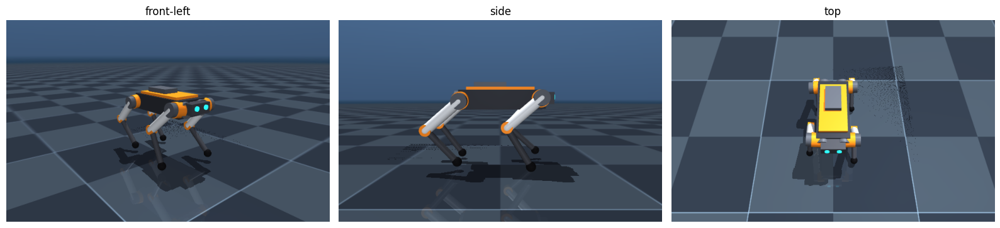

In [8]:
import time

import gymnasium as gym
import matplotlib.pyplot as plt
import mujoco
import numpy as np
import pandas as pd
from IPython.display import Video, display

import quadbot
from quadbot import ENV_ID, QuadBotEnvConfig, RobotSpec
from quadbot.policy import NumpyPolicy
from quadbot.training import (
    TrainConfig, evaluate_policy_metrics, evaluation_summary_lines, export_policy_npz, gait_analysis, train,
)
from quadbot.viz import figure_to_array, footfall_figure, make_showcase_video, record_rollout, training_curve_figure

spec = RobotSpec()
env = gym.make(ENV_ID, render_mode="rgb_array")
base = env.unwrapped
print(f"{ENV_ID}: obs {env.observation_space.shape}, action {env.action_space.shape}, "
      f"control dt {base.dt * 1000:.0f} ms, physics dt {base.model.opt.timestep * 1000:.0f} ms")
print(f"Robot mass {spec.total_mass:.2f} kg | nominal standing height {spec.nominal_height:.3f} m | "
      f"bodies {base.model.nbody} | actuators {base.model.nu}")

env.reset(seed=0)
views = [("front-left", 140, -15, 1.4), ("side", 90, -5, 1.2), ("top", 180, -60, 1.5)]
fig, axes = plt.subplots(1, 3, figsize=(16, 4.5))
for ax, (name, az, el, dist) in zip(axes, views):
    base._renderer = None  # rebuild the camera for each view
    base.cfg.camera_azimuth, base.cfg.camera_elevation, base.cfg.camera_distance = az, el, dist
    ax.imshow(base.render_frame(640, 400))
    ax.set_title(name)
    ax.axis("off")
plt.tight_layout()
plt.show()
env.close()

In [9]:
from gymnasium.utils.env_checker import check_env as gym_check_env
from stable_baselines3.common.env_checker import check_env as sb3_check_env

gym_check_env(gym.make(ENV_ID).unwrapped, skip_render_check=True)
sb3_check_env(gym.make(ENV_ID).unwrapped, warn=False)
print("Gymnasium and Stable-Baselines3 API checks passed")

# Zero action = hold the standing pose: the robot must stay up.
env = gym.make(ENV_ID)
obs, info = env.reset(seed=1)
for t in range(250):
    obs, reward, terminated, truncated, info = env.step(np.zeros(12, dtype=np.float32))
    assert not terminated, "robot fell while holding the standing pose"
print(f"Standing test passed: height {info['base_height']:.3f} m after {250 * base.dt:.0f} s")

# Raw simulation throughput with random actions.
t0, steps = time.perf_counter(), 3000
obs, _ = env.reset(seed=2)
for _ in range(steps):
    obs, reward, terminated, truncated, info = env.step(env.action_space.sample())
    if terminated or truncated:
        obs, _ = env.reset()
print(f"Single-env speed: {steps / (time.perf_counter() - t0):,.0f} steps/s")
env.close()

/usr/local/lib/python3.13/dist-packages/gymnasium/utils/env_checker.py:317: UserWarning: WARN: A Box observation space minimum value is -infinity. This is probably too low.
  logger.warn(
/usr/local/lib/python3.13/dist-packages/gymnasium/utils/env_checker.py:321: UserWarning: WARN: A Box observation space maximum value is infinity. This is probably too high.
  logger.warn(


Gymnasium and Stable-Baselines3 API checks passed
Standing test passed: height 0.301 m after 5 s
Single-env speed: 1,042 steps/s


## 6 · Train PPO
PPO settings (in `TrainConfig`): 16 environments × 256 steps = 4,096 samples per update, 5 epochs with minibatches of 1,024, γ = 0.99, λ = 0.95, clip 0.2, learning rate 3e-4 → 5e-5 (linear), ELU MLP (256, 256, 128) for both actor and critic, observation and reward normalisation.

Progress is printed every 100k steps. Checkpoints (with normaliser stats) are written every 500k steps and the best evaluation model is kept in `runs/quadbot_ppo/best/` together with its matching normaliser.

**Interrupted?** With `RESUME = True`, re-running the training cell continues from the newest checkpoint (same learning-rate schedule, learning curve and evaluation log). Colab wipes `/content` when the runtime is recycled, so for long runs point `RUN_DIR` at a mounted Google Drive folder.

In [10]:
# @title Training configuration { run: "auto" }
QUICK_RUN = False  # @param {type:"boolean"}
TOTAL_TIMESTEPS = 8_000_000  # @param {type:"integer"}
TURNING_COMMANDS = True  # @param {type:"boolean"}
DOMAIN_RANDOMIZATION = False  # @param {type:"boolean"}
N_ENVS = 16  # @param {type:"integer"}
RESUME = True  # @param {type:"boolean"}
RUN_DIR = "runs/quadbot_ppo"
VIDEO_RESOLUTION = (1280, 720)

env_cfg = QuadBotEnvConfig(
    command_yaw_range=(-0.6, 0.6) if TURNING_COMMANDS else (0.0, 0.0),
    domain_randomization=DOMAIN_RANDOMIZATION,
)
train_cfg = TrainConfig(
    total_timesteps=150_000 if QUICK_RUN else TOTAL_TIMESTEPS,
    n_envs=N_ENVS,
    run_dir=RUN_DIR,
    env=env_cfg,
    eval_every_steps=50_000 if QUICK_RUN else 250_000,
    checkpoint_every_steps=0 if QUICK_RUN else 500_000,
)
print(f"{train_cfg.total_timesteps:,} steps with {N_ENVS} envs "
      f"(expect roughly {train_cfg.total_timesteps / 2500 / 60:.0f} min at ~2,500 steps/s)")

8,000,000 steps with 16 envs (expect roughly 53 min at ~2,500 steps/s)


In [11]:
model, vecnorm, metrics = train(train_cfg, resume=RESUME)

[  102,400 steps |   2.0 min |   853 sps] ep_return=   120.1 ep_len= 872.0 vx= 0.22 m/s |vx err|=0.45


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


[  200,704 steps |   3.8 min |   878 sps] ep_return=   422.8 ep_len= 829.6 vx= 0.57 m/s |vx err|=0.20
[  303,104 steps |   5.8 min |   870 sps] ep_return=   757.8 ep_len= 931.5 vx= 0.59 m/s |vx err|=0.10
[  401,408 steps |   7.6 min |   879 sps] ep_return=   976.0 ep_len= 970.9 vx= 0.64 m/s |vx err|=0.09
[  503,808 steps |   9.6 min |   875 sps] ep_return=  1084.0 ep_len= 944.7 vx= 0.61 m/s |vx err|=0.07
[  602,112 steps |  11.4 min |   881 sps] ep_return=  1197.7 ep_len= 980.5 vx= 0.62 m/s |vx err|=0.07
[  700,416 steps |  13.2 min |   881 sps] ep_return=  1259.6 ep_len= 960.8 vx= 0.59 m/s |vx err|=0.07
[  802,816 steps |  15.2 min |   882 sps] ep_return=  1352.2 ep_len= 984.6 vx= 0.67 m/s |vx err|=0.06
[  901,120 steps |  17.0 min |   885 sps] ep_return=  1402.4 ep_len= 986.0 vx= 0.63 m/s |vx err|=0.05
[1,003,520 steps |  18.9 min |   883 sps] ep_return=  1429.5 ep_len= 965.3 vx= 0.66 m/s |vx err|=0.06
[1,101,824 steps |  20.7 min |   887 sps] ep_return=  1493.1 ep_len= 985.8 vx= 0.6

In [12]:
# Optional: live TensorBoard (run in a separate cell while training, or afterwards).
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


## 7 · Learning curves

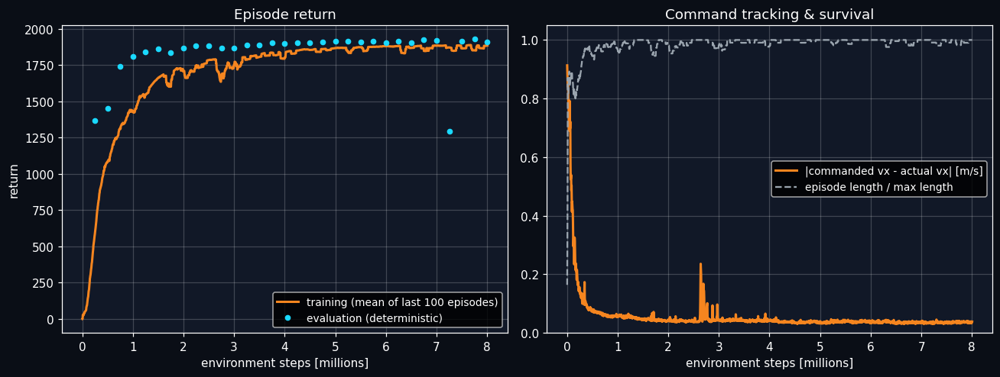

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [13]:
fig = training_curve_figure(RUN_DIR)
plt.show()

## 8 · Export, evaluate, and analyse the gait
The actor network and the observation normaliser are exported to a single `.npz`. `NumpyPolicy` runs it with NumPy only (verified to match SB3's deterministic actions to ~1e-7), which is handy for deployment and makes the file independent of SB3/PyTorch versions.

`gait_analysis()` then records foot contacts at 0.7 m/s. Two feet are *in phase* when both are on the ground or both are in the air: diagonal pairs in phase means a **trot**, same-side pairs a **pace**, front/rear pairs a **bound**.

max |SB3 - NumPy| action difference: 6.556510925292969e-07


,command_vx,episode,return_,steps,fell,mean_vx,distance_m
0,0.4,0,1939.3,1000,False,0.395,7.92
1,0.4,1,1939.8,1000,False,0.395,7.89
2,0.7,0,1921.3,1000,False,0.684,13.61
3,0.7,1,1918.9,1000,False,0.685,13.60
4,1.0,0,1887.6,1000,False,0.990,19.57
5,1.0,1,1887.5,1000,False,0.990,19.58


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


Falls: 0/6 | mean |vx error|: 0.010 m/s
Gait at 0.7 m/s: trot | in phase: diagonal 94%, same side 5%, front/rear 5% | 1.97 strides/s | duty factor 0.50


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


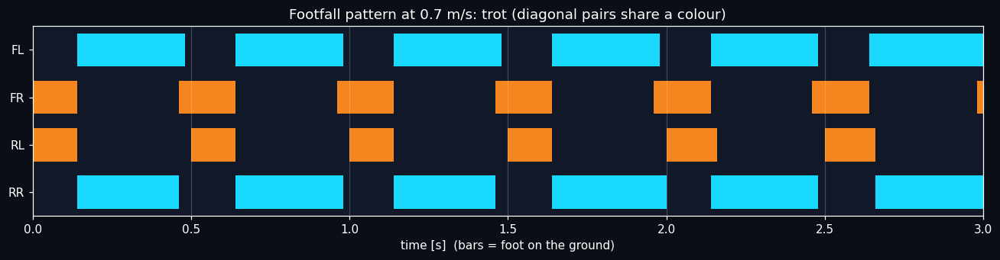

In [14]:
POLICY_PATH = export_policy_npz(model, vecnorm, f"{RUN_DIR}/quadbot_policy.npz")
policy = NumpyPolicy(POLICY_PATH)

# Sanity check: NumPy policy == SB3 policy.
probe_env = gym.make(ENV_ID, config=env_cfg)
obs, _ = probe_env.reset(seed=0)
sb3_action, _ = model.predict(vecnorm.normalize_obs(obs), deterministic=True)
print("max |SB3 - NumPy| action difference:", float(np.abs(sb3_action - policy(obs)).max()))
probe_env.close()

eval_rows = evaluate_policy_metrics(policy, env_cfg, commands=(0.4, 0.7, 1.0), episodes_per_command=2)
results = pd.DataFrame(eval_rows)
display(results)
print(f"Falls: {int(results.fell.sum())}/{len(results)} | "
      f"mean |vx error|: {np.mean(np.abs(results.mean_vx - results.command_vx)):.3f} m/s")

gait = gait_analysis(policy, env_cfg, command=(0.7, 0.0, 0.0), seconds=8.0)
print(f"Gait at 0.7 m/s: {gait['label']} | in phase: diagonal {gait['diagonal_sync']:.0%}, "
      f"same side {gait['lateral_sync']:.0%}, front/rear {gait['fore_hind_sync']:.0%} | "
      f"{gait['stride_hz']:.2f} strides/s | duty factor {np.mean(gait['duty_factor']):.2f}")
fig = footfall_figure(gait["contacts"][:150], gait["dt"],
                      f"Footfall pattern at 0.7 m/s: {gait['label']} (diagonal pairs share a colour)")
plt.show()

## 9 · Record the video
The showcase video contains: a title card, the untrained robot (random actions), the trained policy following forward-speed commands (0.4 → 0.7 → 1.0 m/s), turning on yaw-rate commands, a 5× slow-motion close-up of the gait (every 4 ms physics step is rendered, so the slow motion stays smooth), the learning curve, the footfall diagram and a results card. The HUD shows commanded vs. measured velocity and lights up each foot while it is in contact.

Frames are streamed straight into the H.264 encoder, so memory use stays flat. CPU runtimes render with software OpenGL: 720p takes several minutes, so lower `VIDEO_RESOLUTION` (Section 6) for a quicker preview.

In [15]:
VIDEO_PATH = f"{RUN_DIR}/quadbot_demo.mp4"
curve_fig = training_curve_figure(RUN_DIR)
foot_fig = footfall_figure(gait["contacts"][:150], gait["dt"],
                           f"Footfall pattern at 0.7 m/s: {gait['label']} (diagonal pairs share a colour)",
                           figsize=(12, 5))
curve_img, foot_img = figure_to_array(curve_fig), figure_to_array(foot_fig)
plt.close(curve_fig)
plt.close(foot_fig)

t0 = time.time()
video_stats = make_showcase_video(
    policy, env_cfg, VIDEO_PATH,
    subtitle_lines=[
        "Gymnasium env  +  MuJoCo physics  +  PPO (Stable-Baselines3)",
        f"{train_cfg.total_timesteps / 1e6:g}M environment steps",
    ],
    curve_image=curve_img,
    extra_cards=[(foot_img, "Gait analysis")],
    results_lines=evaluation_summary_lines(eval_rows, gait),
    gait_name=gait["label"],
    include_turning=TURNING_COMMANDS,
    width=VIDEO_RESOLUTION[0], height=VIDEO_RESOLUTION[1],
)
print(f"Rendered {video_stats['video']['seconds']:.0f} s of video in {(time.time() - t0) / 60:.1f} min")
print({k: v for k, v in video_stats.items() if k != "video"})
display(Video(VIDEO_PATH, embed=True, width=960))

Rendered 45 s of video in 15.7 min
{'random': {'mean_vx': -0.2387013580871386, 'falls': 0, 'distance': -0.667487491384599, 'frames': 150}, 'speed_sweep': {'mean_vx': 0.7093376953736181, 'falls': 0, 'distance': 7.0793441290374854, 'frames': 500}, 'turning': {'mean_vx': 0.5834842984867374, 'falls': 0, 'distance': 2.0699616359434923, 'frames': 400}, 'slow_motion': {'mean_vx': 0.78756915622583, 'falls': 0, 'distance': 1.9480042796718826, 'frames': 400}}


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


## 10 · Save and download

In [16]:
import zipfile

ARCHIVE = "quadbot_results.zip"
keep = [
    f"{RUN_DIR}/final_model.zip", f"{RUN_DIR}/vecnormalize.pkl", f"{RUN_DIR}/quadbot_policy.npz",
    f"{RUN_DIR}/config.json", f"{RUN_DIR}/training_history.json", f"{RUN_DIR}/eval/evaluations.npz",
    VIDEO_PATH,
] + [f"quadbot/{name}" for name in sorted(os.listdir("quadbot")) if name.endswith(".py")]
with zipfile.ZipFile(ARCHIVE, "w", zipfile.ZIP_DEFLATED) as zf:
    for path in keep:
        if os.path.exists(path):
            zf.write(path)
print(f"{ARCHIVE}: {os.path.getsize(ARCHIVE) / 1e6:.1f} MB")

if IN_COLAB:
    from google.colab import files
    files.download(ARCHIVE)
    # To keep results across sessions instead:
    # from google.colab import drive; drive.mount("/content/drive")
    # shutil.copy(ARCHIVE, "/content/drive/MyDrive/")

quadbot_results.zip: 10.1 MB


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [24]:
%%writefile quadbot/sim_viewer.py
"""Interactive 3D viewer for the QuadBot simulation (MuJoCo physics, drawn with three.js).

The physics and the policy run in Python on the real :class:`~quadbot.env.QuadBotEnv`; the
browser only draws every body at the pose MuJoCo computed, so this shows the simulation itself
rather than a pre-rendered video.

* ``mode="live"`` (Google Colab): the simulation advances in real time inside the notebook
  kernel while you steer the robot with the on-screen controls or the keyboard.
* ``mode="replay"`` (any notebook, or a standalone HTML file): a command schedule is simulated
  first and then played back with pause, scrubbing and slow motion.

Both modes have an orbit/zoom/pan camera, an optional follow camera, foot-contact highlighting,
the robot's path on the floor, and arrows that show external pushes.
"""
from __future__ import annotations

import base64
import dataclasses
import io
import json
import uuid
from typing import Callable, Sequence

import mujoco
import numpy as np

from . import LEG_NAMES
from .env import QuadBotEnv, QuadBotEnvConfig

THREE_VERSION = "0.160.0"
COLAB_CALLBACK = "quadbot.sim_step"
Command = tuple[float, float, float]
DEFAULT_TOUR: tuple[tuple[float, Command], ...] = (
    (4.0, (0.5, 0.0, 0.0)),
    (5.0, (0.8, 0.0, 0.5)),
    (4.0, (1.0, 0.0, 0.0)),
    (5.0, (0.7, 0.0, -0.5)),
    (4.0, (0.4, 0.0, 0.0)),
)
_FIELDS = ("t", "pose", "cmd", "vx", "wz", "h", "c", "cut", "push")
_LIVE_SESSIONS: dict[str, "SimulationRunner"] = {}


def _r(values, digits: int = 4) -> list[float]:
    return [round(float(v), digits) for v in np.ravel(values)]


# --------------------------------------------------------------------------- scene export
def _rgb_texture_id(model: mujoco.MjModel, mat_id: int) -> int:
    texid = np.atleast_1d(model.mat_texid[mat_id])
    role = int(getattr(getattr(mujoco, "mjtTextureRole", None), "mjTEXROLE_RGB", 1)) if texid.size > 1 else 0
    tex = int(texid[role])
    if tex < 0 or int(model.tex_type[tex]) != int(mujoco.mjtTexture.mjTEXTURE_2D):
        return -1
    return tex


def _texture_data_url(model: mujoco.MjModel, tex_id: int) -> str:
    from PIL import Image

    w, h = int(model.tex_width[tex_id]), int(model.tex_height[tex_id])
    channels = int(model.tex_nchannel[tex_id]) if hasattr(model, "tex_nchannel") else 3
    adr = int(model.tex_adr[tex_id])
    pixels = np.asarray(model.tex_data[adr : adr + w * h * channels]).reshape(h, w, channels)
    image = Image.fromarray(np.ascontiguousarray(pixels[..., :3]).astype(np.uint8), "RGB")
    buffer = io.BytesIO()
    image.save(buffer, format="PNG", optimize=True)
    return "data:image/png;base64," + base64.b64encode(buffer.getvalue()).decode("ascii")


def scene_description(model: mujoco.MjModel) -> dict:
    """Visible geometry (MuJoCo's default geom groups 0-2) in a form the browser can draw."""
    feet = {}
    for k, leg in enumerate(LEG_NAMES):
        try:
            feet[model.geom(f"{leg}_foot").id] = k
        except KeyError:
            pass
    free = np.flatnonzero(model.jnt_type == mujoco.mjtJoint.mjJNT_FREE)
    geoms: list[dict] = []
    textures: list[dict] = []
    texture_index: dict[tuple[int, int], int] = {}
    for g in range(model.ngeom):
        if model.geom_group[g] > 2:  # collision-only geoms are hidden, as in MuJoCo's viewer
            continue
        mat = int(model.geom_matid[g])
        rgba = model.mat_rgba[mat] if mat >= 0 else model.geom_rgba[g]
        if rgba[3] <= 0:
            continue
        item = dict(
            id=g,
            type=int(model.geom_type[g]),
            body=int(model.geom_bodyid[g]),
            size=_r(model.geom_size[g], 5),
            pos=_r(model.geom_pos[g], 5),
            quat=_r(model.geom_quat[g], 6),
            rgba=_r(rgba, 3),
            emission=round(float(model.mat_emission[mat]), 3) if mat >= 0 else 0.0,
            roughness=round(float(np.clip(1.0 - 0.7 * model.mat_shininess[mat], 0.3, 1.0)), 3) if mat >= 0 else 0.8,
            foot=feet.get(g, -1),
            texture=-1,
        )
        if item["type"] == int(mujoco.mjtGeom.mjGEOM_MESH):
            mesh = int(model.geom_dataid[g])
            v0, nv = int(model.mesh_vertadr[mesh]), int(model.mesh_vertnum[mesh])
            f0, nf = int(model.mesh_faceadr[mesh]), int(model.mesh_facenum[mesh])
            item["vert"] = _r(model.mesh_vert[v0 : v0 + nv], 5)
            item["face"] = [int(i) for i in np.ravel(model.mesh_face[f0 : f0 + nf])]
        if mat >= 0 and (tex := _rgb_texture_id(model, mat)) >= 0:
            if (tex, mat) not in texture_index:
                texture_index[(tex, mat)] = len(textures)
                textures.append(
                    dict(
                        png=_texture_data_url(model, tex),
                        repeat=_r(model.mat_texrepeat[mat], 4),
                        uniform=bool(model.mat_texuniform[mat]),
                    )
                )
            item["texture"] = texture_index[(tex, mat)]
        geoms.append(item)
    base = int(model.jnt_bodyid[free[0]]) if len(free) else 1
    return dict(nbody=int(model.nbody), base=base, geoms=geoms, textures=textures)


# ------------------------------------------------------------------------------ simulation
class SimulationRunner:
    """Steps the real QuadBot environment with a policy and packs body poses for the viewer.

    The environment is created without a time limit, so a live session can run indefinitely.
    Commands are clipped to the ranges the policy was trained on.
    """

    def __init__(
        self,
        policy: Callable[[np.ndarray], np.ndarray],
        env_cfg: QuadBotEnvConfig | None = None,
        seed: int = 0,
    ) -> None:
        self.cfg = env_cfg or QuadBotEnvConfig()
        self.env = QuadBotEnv(config=self.cfg)
        self.policy = policy
        self.model, self.data, self.dt = self.env.model, self.env.data, self.env.dt
        self.rng = np.random.default_rng(seed)
        self.yaw_max = float(max(abs(v) for v in self.cfg.command_yaw_range))
        self.command: Command = (round(float(np.mean(self.cfg.command_vx_range)), 2), 0.0, 0.0)
        self.t, self.falls = 0.0, 0
        self._cut, self._push = True, 0
        self.obs, _ = self.env.reset(seed=seed, options={"command": self.command})

    def reset(self) -> None:
        self.obs, _ = self.env.reset(options={"command": self.command})
        self._cut = True

    def set_command(self, vx: float, yaw_rate: float = 0.0) -> None:
        vx = float(np.clip(vx, *self.cfg.command_vx_range))
        yaw_rate = float(np.clip(yaw_rate, -self.yaw_max, self.yaw_max))
        self.command = (vx, 0.0, yaw_rate)
        self.env.set_command(*self.command)

    def push(self, speed: float) -> None:
        """Sideways velocity kick on the torso, as if the robot were shoved."""
        w, x, y, z = self.data.qpos[3:7]
        heading = np.arctan2(2.0 * (w * z + x * y), 1.0 - 2.0 * (y * y + z * z))
        side = self.rng.choice((-1.0, 1.0))
        kick = speed * side * np.array([-np.sin(heading), np.cos(heading)])
        self.data.qvel[0:2] += kick
        self._push = _r(kick, 3)

    def run(self, n_steps: int, include_current: bool = False) -> dict:
        """Advance ``n_steps`` control steps; returns one viewer frame per step."""
        out: dict[str, list] = {key: [] for key in _FIELDS}
        if include_current:
            self._record(out, None)
        for _ in range(int(n_steps)):
            self.obs, _, terminated, _, info = self.env.step(self.policy(self.obs))
            self.t += self.dt
            self._record(out, info)
            if terminated:
                self.falls += 1
                self.reset()
        return out

    def _record(self, out: dict, info: dict | None) -> None:
        d = self.data
        mujoco.mj_kinematics(self.model, d)  # body poses for the current qpos
        out["t"].append(round(self.t, 4))
        out["pose"].append(_r(np.hstack([d.xpos[1:], d.xquat[1:]])))
        out["cmd"].append([round(self.command[0], 3), round(self.command[2], 3)])
        out["vx"].append(round(float(info["x_velocity"]), 3) if info else 0.0)
        out["wz"].append(round(float(info["yaw_rate"]), 3) if info else 0.0)
        out["h"].append(round(float(info["base_height"] if info else d.qpos[2]), 3))
        out["c"].append(int(np.dot(self.env.foot_contacts, (1, 2, 4, 8))))
        out["cut"].append(int(self._cut))
        out["push"].append(self._push)
        self._cut, self._push = False, 0

    def close(self) -> None:
        self.env.close()


def record_session(
    policy: Callable[[np.ndarray], np.ndarray],
    env_cfg: QuadBotEnvConfig | None = None,
    schedule: Sequence[tuple[float, Command]] = DEFAULT_TOUR,
    push_every: float = 0.0,
    push_speed: float = 0.5,
    seed: int = 0,
) -> dict:
    """Simulate ``schedule`` [(seconds, (vx, vy, yaw_rate)), ...] and return viewer frames.

    ``vy`` is ignored (the policy was trained to walk forward); ``push_every`` > 0 shoves the
    robot sideways every that many seconds.
    """
    runner = SimulationRunner(policy, env_cfg, seed)
    runner.set_command(schedule[0][1][0], schedule[0][1][2])
    runner.reset()
    frames = runner.run(0, include_current=True)
    since_push = 0.0
    for seconds, (vx, _vy, yaw_rate) in schedule:
        runner.set_command(vx, yaw_rate)
        for _ in range(int(round(seconds / runner.dt))):
            since_push += runner.dt
            if push_every > 0 and since_push >= push_every:
                runner.push(push_speed)
                since_push = 0.0
            for key, values in runner.run(1).items():
                frames[key].extend(values)
    frames["falls"] = runner.falls
    runner.close()
    return frames


# ----------------------------------------------------------------------------- live (Colab)
def in_colab() -> bool:
    try:
        import google.colab  # noqa: F401
    except ImportError:
        return False
    return True


def _live_step(session: str, n_steps: int, vx: float, yaw_rate: float, push: float, reset: bool):
    """Colab callback: advance the live session and return the new frames as JSON."""
    from IPython.display import JSON

    runner = _LIVE_SESSIONS.get(session)
    if runner is None:
        return JSON({"error": "this live session has ended"})
    if reset:
        runner.reset()
    runner.set_command(float(vx), float(yaw_rate))
    if push:
        runner.push(float(push))
    frames = runner.run(int(np.clip(n_steps, 0, 100)), include_current=bool(reset))
    frames["falls"] = runner.falls
    return JSON(frames)


def _register_colab_callback() -> None:
    from google.colab import output

    output.register_callback(COLAB_CALLBACK, _live_step)


# ------------------------------------------------------------------------------ HTML output
def simulation_html(
    policy: Callable[[np.ndarray], np.ndarray],
    env_cfg: QuadBotEnvConfig | None = None,
    mode: str = "replay",
    schedule: Sequence[tuple[float, Command]] = DEFAULT_TOUR,
    push_every: float = 0.0,
    push_speed: float = 0.5,
    height: int = 560,
    seed: int = 0,
    domain_randomization: bool = False,
    standalone: bool = False,
) -> str:
    """HTML for the interactive viewer (see the module docstring for the two modes)."""
    if mode not in ("live", "replay"):
        raise ValueError("mode must be 'live' or 'replay'")
    cfg = dataclasses.replace(env_cfg or QuadBotEnvConfig(), domain_randomization=domain_randomization)
    uid = uuid.uuid4().hex[:12]
    runner = SimulationRunner(policy, cfg, seed)
    config = dict(
        mode=mode,
        session=uid,
        callback=COLAB_CALLBACK,
        vx_range=_r(cfg.command_vx_range, 3),
        yaw_max=round(runner.yaw_max, 3),
        vx0=runner.command[0],
        push_speed=push_speed,
        chunk=12,
        lead=0.35,
    )
    data = None
    scene = scene_description(runner.model)
    if mode == "replay":
        runner.close()
        data = record_session(policy, cfg, schedule, push_every, push_speed, seed)
    else:
        for old in _LIVE_SESSIONS.values():  # one live robot at a time
            old.close()
        _LIVE_SESSIONS.clear()
        _LIVE_SESSIONS[uid] = runner
        _register_colab_callback()
    page = (
        _TEMPLATE.replace("__UID__", uid)
        .replace("__HEIGHT__", str(int(height)))
        .replace("__THREE__", THREE_VERSION)
        .replace("__CONFIG__", json.dumps(config))
        .replace("__DATA__", json.dumps(data, separators=(",", ":")))
        .replace("__SCENE__", json.dumps(scene, separators=(",", ":")))
    )
    if standalone:
        page = (
            "<!doctype html><html><head><meta charset='utf-8'>"
            "<meta name='viewport' content='width=device-width, initial-scale=1'>"
            "<title>QuadBot simulation</title></head>"
            "<body style='margin:0;padding:12px;background:#0a0e16'>" + page + "</body></html>"
        )
    return page


def show_simulation(
    policy: Callable[[np.ndarray], np.ndarray],
    env_cfg: QuadBotEnvConfig | None = None,
    mode: str = "auto",
    **kwargs,
) -> None:
    """Display the viewer in a notebook. ``mode="auto"``: live in Colab, replay elsewhere."""
    from IPython.display import HTML, display

    if mode == "auto":
        mode = "live" if in_colab() else "replay"
    if mode == "live" and not in_colab():
        raise RuntimeError("live mode needs Google Colab's kernel callbacks; use mode='replay' here")
    display(HTML(simulation_html(policy, env_cfg, mode=mode, **kwargs)))


def save_simulation_html(
    path: str,
    policy: Callable[[np.ndarray], np.ndarray],
    env_cfg: QuadBotEnvConfig | None = None,
    **kwargs,
) -> str:
    """Write a standalone replay page (it only needs internet access to load three.js)."""
    with open(path, "w", encoding="utf-8") as f:
        f.write(simulation_html(policy, env_cfg, mode="replay", standalone=True, **kwargs))
    return path


_TEMPLATE = r"""<div id="qb-__UID__" class="qb-root" tabindex="0">
  <div class="qb-msg">Loading the 3D viewer…</div>
  <div class="qb-panel qb-hud"></div>
  <div class="qb-panel qb-feet"><span>FL</span><span>FR</span><span>RL</span><span>RR</span></div>
  <div class="qb-panel qb-help"></div>
  <div class="qb-panel qb-bar"></div>
</div>
<style>
#qb-__UID__ { position: relative; width: 100%; height: __HEIGHT__px; min-height: 320px; background: #0d1424;
  border-radius: 10px; overflow: hidden; outline: none; color: #e8edf5;
  font: 13px/1.4 system-ui, -apple-system, "Segoe UI", Roboto, sans-serif; user-select: none; -webkit-user-select: none; }
#qb-__UID__:focus-visible { box-shadow: inset 0 0 0 2px #f5851f; }
#qb-__UID__ canvas { display: block; cursor: grab; }
#qb-__UID__ .qb-panel { position: absolute; background: rgba(10, 14, 22, 0.74); border-radius: 8px; padding: 6px 10px; }
#qb-__UID__ .qb-hud { top: 10px; left: 10px; white-space: pre; font: 12px/1.45 ui-monospace, SFMono-Regular, Menlo, Consolas, monospace; }
#qb-__UID__ .qb-hud b { color: #f5851f; }
#qb-__UID__ .qb-feet { top: 10px; right: 10px; display: flex; gap: 5px; }
#qb-__UID__ .qb-feet span { padding: 2px 7px; border-radius: 5px; background: #2a3342; color: #8b96a8;
  font: 600 11px ui-monospace, Menlo, Consolas, monospace; }
#qb-__UID__ .qb-feet span.on { background: #16c8ff; color: #06202b; }
#qb-__UID__ .qb-help { top: 46px; right: 10px; font-size: 11px; color: #aab4c3; text-align: right; white-space: pre; }
#qb-__UID__ .qb-bar { left: 10px; right: 10px; bottom: 10px; display: flex; flex-wrap: wrap; gap: 8px 14px; align-items: center; }
#qb-__UID__ .qb-bar label { display: flex; align-items: center; gap: 6px; white-space: nowrap; }
#qb-__UID__ .qb-bar input[type=range] { accent-color: #f5851f; }
#qb-__UID__ .qb-grow { flex: 1 1 160px; }
#qb-__UID__ button, #qb-__UID__ select { background: #242d3b; color: #e8edf5; border: 1px solid #3a4557;
  border-radius: 6px; padding: 3px 10px; font: inherit; cursor: pointer; }
#qb-__UID__ button:hover { border-color: #f5851f; }
#qb-__UID__ .qb-num { display: inline-block; min-width: 5.5em; font-family: ui-monospace, Menlo, Consolas, monospace; }
#qb-__UID__ .qb-msg { position: absolute; left: 50%; top: 50%; transform: translate(-50%, -50%); max-width: 80%;
  padding: 10px 14px; border-radius: 8px; background: rgba(10, 14, 22, 0.85); text-align: center; pointer-events: none; z-index: 2; }
#qb-__UID__ .qb-msg:empty { display: none; }
</style>
<script>
setTimeout(function () {
  var root = document.getElementById("qb-__UID__");
  if (root && !root.dataset.ready) {
    root.querySelector(".qb-msg").textContent =
      "The 3D viewer did not start. It loads three.js from cdn.jsdelivr.net, so it needs internet access and WebGL.";
  }
}, 20000);
</script>
<script type="module">
import * as THREE from "https://cdn.jsdelivr.net/npm/three@__THREE__/+esm";
import { OrbitControls } from "https://cdn.jsdelivr.net/npm/three@__THREE__/examples/jsm/controls/OrbitControls.js/+esm";

const root = document.getElementById("qb-__UID__");
const SCENE = __SCENE__;
const CFG = __CONFIG__;
const REPLAY = __DATA__;
const LIVE = CFG.mode === "live";
const $ = (selector) => root.querySelector(selector);
const msg = (text) => { $(".qb-msg").textContent = text; };

// ---- core: geometry and poses, in MuJoCo's world frame (z up) ---------------------- @core-begin
const PLANE_HALF = 60;

function makeGeometry(g) {
  const s = g.size;
  switch (g.type) {
    case 0: return new THREE.PlaneGeometry(2 * (s[0] || PLANE_HALF), 2 * (s[1] || PLANE_HALF));
    case 2: return new THREE.SphereGeometry(s[0], 24, 16);
    case 3: return new THREE.CapsuleGeometry(s[0], 2 * s[1], 8, 16).rotateX(Math.PI / 2);
    case 4: return new THREE.SphereGeometry(1, 24, 16).scale(s[0], s[1], s[2]);
    case 5: return new THREE.CylinderGeometry(s[0], s[0], 2 * s[1], 32).rotateX(Math.PI / 2);
    case 6: return new THREE.BoxGeometry(2 * s[0], 2 * s[1], 2 * s[2]);
    case 7: {
      const geometry = new THREE.BufferGeometry();
      geometry.setAttribute("position", new THREE.Float32BufferAttribute(g.vert, 3));
      geometry.setIndex(g.face);
      geometry.computeVertexNormals();
      return geometry;
    }
    default: return null; // height fields and SDF geoms are not drawn
  }
}

// One group per MuJoCo body (index = body id); geoms are children at their local pose.
function buildBodies(scene, makeMaterial) {
  const bodies = [];
  for (let b = 0; b < SCENE.nbody; b++) {
    const group = new THREE.Group();
    scene.add(group);
    bodies.push(group);
  }
  const feet = [], planes = [];
  SCENE.geoms.forEach((g, index) => {
    const geometry = makeGeometry(g);
    if (!geometry) return;
    const mesh = new THREE.Mesh(geometry, makeMaterial(g));
    mesh.position.fromArray(g.pos);
    mesh.quaternion.set(g.quat[1], g.quat[2], g.quat[3], g.quat[0]);
    mesh.castShadow = g.type !== 0;
    mesh.receiveShadow = true;
    mesh.userData.index = index;
    bodies[g.body].add(mesh);
    if (g.foot >= 0) feet[g.foot] = mesh;
    if (g.type === 0 && g.body === 0) planes.push({ mesh, g });
  });
  return { bodies, feet, planes };
}

const _qa = new THREE.Quaternion(), _qb = new THREE.Quaternion();
const _va = new THREE.Vector3(), _vb = new THREE.Vector3();

// Frames hold [x y z qw qx qy qz] for bodies 1..nbody-1; blend frame A towards B by alpha.
function setPose(bodies, A, B, alpha) {
  for (let i = 1; i < bodies.length; i++) {
    const o = 7 * (i - 1);
    _va.set(A[o], A[o + 1], A[o + 2]);
    _vb.set(B[o], B[o + 1], B[o + 2]);
    bodies[i].position.lerpVectors(_va, _vb, alpha);
    _qa.set(A[o + 4], A[o + 5], A[o + 6], A[o + 3]).normalize();
    _qb.set(B[o + 4], B[o + 5], B[o + 6], B[o + 3]).normalize();
    bodies[i].quaternion.slerpQuaternions(_qa, _qb, alpha);
  }
}
// ------------------------------------------------------------------------------------ @core-end

function start() {
  let renderer;
  try {
    renderer = new THREE.WebGLRenderer({ antialias: true });
  } catch (err) {
    msg("WebGL is not available in this browser, so the 3D view cannot be shown.");
    return;
  }
  let simTime = 0, playing = true, speed = 1, seeking = false, follow = true, showTrail = true;
  renderer.setPixelRatio(Math.min(window.devicePixelRatio || 1, 2));
  renderer.shadowMap.enabled = true;
  renderer.shadowMap.type = THREE.PCFSoftShadowMap;
  root.prepend(renderer.domElement);

  // ---- world: sky, fog, camera, lights
  const scene = new THREE.Scene();
  const HORIZON = 0x3d5a78;
  scene.fog = new THREE.Fog(HORIZON, 6, 26);
  const sky = new THREE.Mesh(
    new THREE.SphereGeometry(100, 32, 16),
    new THREE.ShaderMaterial({
      side: THREE.BackSide,
      depthWrite: false,
      uniforms: { top: { value: new THREE.Color(0x0c1322) }, horizon: { value: new THREE.Color(HORIZON) } },
      vertexShader:
        "varying vec3 vDir;\nvoid main() { vDir = normalize(position); gl_Position = projectionMatrix * modelViewMatrix * vec4(position, 1.0); }",
      fragmentShader:
        "uniform vec3 top;\nuniform vec3 horizon;\nvarying vec3 vDir;\nvoid main() {\n  gl_FragColor = vec4(mix(horizon, top, smoothstep(-0.05, 0.5, vDir.z)), 1.0);\n#include <colorspace_fragment>\n}",
    })
  );
  sky.renderOrder = -1;
  scene.add(sky);

  const camera = new THREE.PerspectiveCamera(40, 1, 0.02, 300);
  camera.up.set(0, 0, 1);
  camera.position.set(1.3, -1.8, 0.75);
  const controls = new OrbitControls(camera, renderer.domElement);
  controls.target.set(0, 0, 0.22);
  controls.enableDamping = true;
  controls.dampingFactor = 0.08;
  controls.minDistance = 0.3;
  controls.maxDistance = 20;
  controls.maxPolarAngle = Math.PI * 0.49;

  const hemi = new THREE.HemisphereLight(0xdde6f5, 0x2a2f38, 1.5);
  hemi.position.set(0, 0, 1);
  scene.add(hemi);
  const sun = new THREE.DirectionalLight(0xfff4e6, 2.6);
  sun.castShadow = true;
  sun.shadow.mapSize.set(2048, 2048);
  Object.assign(sun.shadow.camera, { left: -2, right: 2, top: 2, bottom: -2, near: 0.5, far: 20 });
  sun.shadow.camera.updateProjectionMatrix();
  sun.shadow.bias = -0.0004;
  sun.shadow.normalBias = 0.015;
  const SUN_OFFSET = new THREE.Vector3(-1.8, 2.4, 7.5);
  scene.add(sun, sun.target);
  const fill = new THREE.DirectionalLight(0xbfd0ff, 0.7);
  fill.position.set(2, -3, 2);
  scene.add(fill);

  // ---- robot and floor from the MuJoCo model
  const loader = new THREE.TextureLoader();
  const maxAnisotropy = renderer.capabilities.getMaxAnisotropy();
  function makeMaterial(g) {
    const color = new THREE.Color().setRGB(g.rgba[0], g.rgba[1], g.rgba[2], THREE.SRGBColorSpace);
    const params = { color, roughness: g.roughness, metalness: 0.05 };
    if (g.rgba[3] < 1) Object.assign(params, { transparent: true, opacity: g.rgba[3] });
    if (g.emission > 0) Object.assign(params, { emissive: color.clone(), emissiveIntensity: g.emission });
    if (g.foot >= 0) Object.assign(params, { emissive: new THREE.Color(0x000000), emissiveIntensity: 1.4 });
    if (g.texture >= 0) {
      const t = SCENE.textures[g.texture];
      const map = loader.load(t.png);
      map.colorSpace = THREE.SRGBColorSpace;
      map.wrapS = map.wrapT = THREE.RepeatWrapping;
      map.anisotropy = maxAnisotropy;
      const sx = 2 * (g.size[0] || PLANE_HALF), sy = 2 * (g.size[1] || PLANE_HALF);
      map.repeat.set(t.uniform ? t.repeat[0] * sx : t.repeat[0], t.uniform ? t.repeat[1] * sy : t.repeat[1]);
      params.map = map;
    }
    return new THREE.MeshStandardMaterial(params);
  }
  const { bodies, feet, planes } = buildBodies(scene, makeMaterial);
  const base = bodies[SCENE.base];

  const TRAIL_MAX = 2000;
  const trailPositions = new Float32Array(TRAIL_MAX * 3);
  const trailGeometry = new THREE.BufferGeometry();
  trailGeometry.setAttribute("position", new THREE.BufferAttribute(trailPositions, 3));
  trailGeometry.setDrawRange(0, 0);
  const trail = new THREE.Line(trailGeometry, new THREE.LineBasicMaterial({ color: 0xf5851f, transparent: true, opacity: 0.85 }));
  trail.frustumCulled = false;
  scene.add(trail);
  const arrow = new THREE.ArrowHelper(new THREE.Vector3(1, 0, 0), new THREE.Vector3(), 0.5, 0xff4d4d, 0.12, 0.07);
  arrow.visible = false;
  scene.add(arrow);

  // ---- frame buffer (replay: whole recording; live: rolling window)
  const F = { t: [], pose: [], cmd: [], vx: [], wz: [], h: [], c: [], cut: [], push: [], lastCut: [], lastPush: [], falls: [] };
  const KEYS = ["t", "pose", "cmd", "vx", "wz", "h", "c", "cut", "push"];
  const MAX_FRAMES = LIVE ? 4000 : Infinity;
  let cursor = 0, trailK = -1;
  function appendFrames(d) {
    for (let i = 0; i < d.t.length; i++) {
      const k = F.t.length;
      for (const key of KEYS) F[key].push(d[key][i]);
      F.lastCut.push(k === 0 || d.cut[i] ? k : F.lastCut[k - 1]);
      F.lastPush.push(d.push[i] ? k : k ? F.lastPush[k - 1] : -1);
      F.falls.push((k ? F.falls[k - 1] : 0) + (k > 0 && d.cut[i] ? 1 : 0));
    }
    const drop = F.t.length - MAX_FRAMES;
    if (drop > 0) {
      for (const key of Object.keys(F)) F[key].splice(0, drop);
      F.lastCut = F.lastCut.map((v) => Math.max(0, v - drop));
      F.lastPush = F.lastPush.map((v) => (v >= drop ? v - drop : -1));
      cursor = Math.max(0, cursor - drop);
      trailK = -1;
    }
  }
  function clearFrames() {
    for (const key of Object.keys(F)) F[key].length = 0;
    cursor = 0;
    trailK = -1;
  }
  function frameAt(time) {
    const n = F.t.length;
    if (!n) return -1;
    cursor = Math.min(cursor, n - 1);
    while (cursor + 1 < n && F.t[cursor + 1] <= time) cursor++;
    while (cursor > 0 && F.t[cursor] > time) cursor--;
    return cursor;
  }
  function applyTime(time) {
    const k = frameAt(time);
    if (k < 0) return -1;
    let next = F.pose[k], alpha = 0;
    if (k + 1 < F.t.length && !F.cut[k + 1]) {
      next = F.pose[k + 1];
      alpha = THREE.MathUtils.clamp((time - F.t[k]) / (F.t[k + 1] - F.t[k]), 0, 1);
    }
    setPose(bodies, F.pose[k], next, alpha);
    return k;
  }

  // ---- per-frame updates
  const _desired = new THREE.Vector3(), _delta = new THREE.Vector3(), _dir = new THREE.Vector3();
  function updateCamera(dt) {
    const p = base.position;
    if (follow) {
      _desired.set(p.x, p.y, controls.target.z);
      _delta.subVectors(_desired, controls.target);
      if (_delta.length() < 3) _delta.multiplyScalar(1 - Math.exp(-6 * dt));
      controls.target.add(_delta);
      camera.position.add(_delta);
    }
    sun.target.position.copy(p);
    sun.position.copy(p).add(SUN_OFFSET);
    for (const { mesh, g } of planes) {
      if (g.size[0] || g.size[1]) continue; // only infinite planes follow the robot
      const map = mesh.material.map;
      const px = map ? (2 * PLANE_HALF) / map.repeat.x : 1;
      const py = map ? (2 * PLANE_HALF) / map.repeat.y : 1;
      mesh.position.x = g.pos[0] + Math.round((p.x - g.pos[0]) / px) * px;
      mesh.position.y = g.pos[1] + Math.round((p.y - g.pos[1]) / py) * py;
    }
  }
  function updateTrail(k) {
    trail.visible = showTrail;
    if (k === trailK) return;
    trailK = k;
    const start = Math.max(F.lastCut[k], k - TRAIL_MAX + 1);
    const o = 7 * (SCENE.base - 1);
    let n = 0;
    for (let j = start; j <= k; j++, n++) {
      trailPositions[3 * n] = F.pose[j][o];
      trailPositions[3 * n + 1] = F.pose[j][o + 1];
      trailPositions[3 * n + 2] = 0.004;
    }
    trailGeometry.setDrawRange(0, n);
    trailGeometry.attributes.position.needsUpdate = true;
  }
  function updatePush(k, time) {
    const j = F.lastPush[k];
    if (j < 0 || time - F.t[j] > 0.9) {
      arrow.visible = false;
      return;
    }
    const v = F.push[j];
    _dir.set(v[0], v[1], 0);
    const length = 0.25 + 0.5 * _dir.length();
    _dir.normalize();
    arrow.position.set(base.position.x - _dir.x * (length + 0.12), base.position.y - _dir.y * (length + 0.12), base.position.z + 0.05);
    arrow.setDirection(_dir);
    arrow.setLength(length, 0.12, 0.07);
    arrow.visible = true;
  }
  const hudEl = $(".qb-hud");
  const footEls = [...root.querySelectorAll(".qb-feet span")];
  const fmt = (v) => (v >= 0 ? "+" : "") + v.toFixed(2);
  let liveFalls = 0, latency = 0;
  function updateFeet(k) {
    for (let i = 0; i < 4; i++) {
      const on = ((F.c[k] >> i) & 1) === 1;
      footEls[i].classList.toggle("on", on);
      if (feet[i]) feet[i].material.emissive.setHex(on ? 0x16c8ff : 0x000000);
    }
  }
  function updateHud(k) {
    const [cvx, cwz] = F.cmd[k];
    const head = LIVE
      ? `<b>LIVE SIMULATION</b>   t ${F.t[k].toFixed(2)} s   kernel ${latency.toFixed(0)} ms`
      : `<b>REPLAY</b>   t ${(F.t[k] - F.t[0]).toFixed(2)} / ${(F.t[F.t.length - 1] - F.t[0]).toFixed(1)} s`;
    hudEl.innerHTML =
      `${head}\ncommand   vx ${fmt(cvx)} m/s   yaw ${fmt(cwz)} rad/s\n` +
      `measured  vx ${fmt(F.vx[k])} m/s   yaw ${fmt(F.wz[k])} rad/s\n` +
      `height ${F.h[k].toFixed(3)} m   falls ${LIVE ? liveFalls : F.falls[k]}`;
  }

  // ---- controls
  const bar = $(".qb-bar");
  const cmd = { vx: CFG.vx0, yaw: 0 };
  let pushReq = 0, resetReq = LIVE;
  if (LIVE) {
    bar.innerHTML = `
      <button data-act="play">pause</button>
      <label>speed <input data-act="vx" type="range" min="${CFG.vx_range[0]}" max="${CFG.vx_range[1]}" step="0.05" value="${CFG.vx0}"><span class="qb-num" data-out="vx"></span></label>
      <label>turn <input data-act="yaw" type="range" min="${-CFG.yaw_max}" max="${CFG.yaw_max}" step="0.05" value="0" ${CFG.yaw_max ? "" : "disabled"}><span class="qb-num" data-out="yaw"></span></label>
      <button data-act="push">push</button>
      <button data-act="reset">reset</button>
      <label><input data-act="follow" type="checkbox" checked> follow</label>
      <label><input data-act="trail" type="checkbox" checked> path</label>`;
    $(".qb-help").textContent = "drag: orbit · right-drag: pan · wheel: zoom\nkeys (click the view first): arrows = speed / turn · space = push · R = reset";
  } else {
    const speeds = [0.1, 0.25, 0.5, 1, 2].map((v) => `<option value="${v}"${v === 1 ? " selected" : ""}>${v}×</option>`);
    bar.innerHTML = `
      <button data-act="play">pause</button>
      <select data-act="speed">${speeds.join("")}</select>
      <input class="qb-grow" data-act="seek" type="range" min="0" max="1000" value="0">
      <label><input data-act="follow" type="checkbox" checked> follow</label>
      <label><input data-act="trail" type="checkbox" checked> path</label>`;
    $(".qb-help").textContent = "drag: orbit · right-drag: pan · wheel: zoom\nkeys (click the view first): space = play / pause · left / right = skip 1 s";
  }
  const el = (act) => bar.querySelector(`[data-act="${act}"]`);
  const out = (name) => bar.querySelector(`[data-out="${name}"]`);
  function syncCommand() {
    el("vx").value = cmd.vx;
    el("yaw").value = cmd.yaw;
    out("vx").textContent = `${cmd.vx.toFixed(2)} m/s`;
    out("yaw").textContent = `${fmt(cmd.yaw)} rad/s`;
  }
  function setPlaying(value) {
    playing = value;
    el("play").textContent = playing ? "pause" : "play";
  }
  el("play").addEventListener("click", () => setPlaying(!playing));
  el("follow").addEventListener("change", (e) => { follow = e.target.checked; });
  el("trail").addEventListener("change", (e) => { showTrail = e.target.checked; });
  const span = () => F.t[F.t.length - 1] - F.t[0];
  if (LIVE) {
    el("vx").addEventListener("input", (e) => { cmd.vx = +e.target.value; syncCommand(); });
    el("yaw").addEventListener("input", (e) => { cmd.yaw = +e.target.value; syncCommand(); });
    el("push").addEventListener("click", () => { pushReq = CFG.push_speed; });
    el("reset").addEventListener("click", () => { resetReq = true; });
    syncCommand();
  } else {
    const seek = el("seek");
    el("speed").addEventListener("change", (e) => { speed = +e.target.value; });
    seek.addEventListener("pointerdown", () => { seeking = true; });
    window.addEventListener("pointerup", () => { seeking = false; });
    seek.addEventListener("input", () => { simTime = F.t[0] + (seek.value / 1000) * span(); });
  }
  root.addEventListener("pointerdown", () => root.focus({ preventScroll: true }));
  root.addEventListener("keydown", (e) => {
    const key = e.key.length === 1 ? e.key.toLowerCase() : e.key;
    const step = (value, delta, lo, hi) => Math.min(hi, Math.max(lo, Math.round((value + delta) * 100) / 100));
    let handled = true;
    if (LIVE) {
      if (key === "ArrowUp") cmd.vx = step(cmd.vx, 0.05, CFG.vx_range[0], CFG.vx_range[1]);
      else if (key === "ArrowDown") cmd.vx = step(cmd.vx, -0.05, CFG.vx_range[0], CFG.vx_range[1]);
      else if (key === "ArrowLeft") cmd.yaw = step(cmd.yaw, 0.1, -CFG.yaw_max, CFG.yaw_max);
      else if (key === "ArrowRight") cmd.yaw = step(cmd.yaw, -0.1, -CFG.yaw_max, CFG.yaw_max);
      else if (key === " ") pushReq = CFG.push_speed;
      else if (key === "r") resetReq = true;
      else if (key === "p") setPlaying(!playing);
      else handled = false;
      syncCommand();
    } else if (key === " ") setPlaying(!playing);
    else if (key === "ArrowLeft") simTime = Math.max(F.t[0], simTime - 1);
    else if (key === "ArrowRight") simTime = Math.min(F.t[0] + span(), simTime + 1);
    else handled = false;
    if (handled) e.preventDefault();
  });

  // ---- live mode: the Colab kernel advances the physics in small chunks
  let pending = false, pendingSince = 0;
  async function pump() {
    if (pending) return;
    const kernel = window.google && window.google.colab && window.google.colab.kernel;
    if (!kernel) {
      msg("Live mode runs inside Google Colab. Use mode='replay' in other notebooks.");
      return;
    }
    const ahead = F.t.length ? F.t[F.t.length - 1] - simTime : 0;
    const reset = resetReq, push = pushReq;
    if (!reset && !push && !(playing && ahead < CFG.lead)) return;
    resetReq = false;
    pushReq = 0;
    pending = true;
    pendingSince = performance.now();
    try {
      const n = reset ? 0 : CFG.chunk;
      const result = await kernel.invokeFunction(CFG.callback, [CFG.session, n, cmd.vx, cmd.yaw, push, reset], {});
      const d = result.data["application/json"];
      if (d.error) throw new Error(d.error);
      if (reset) {
        clearFrames();
        simTime = d.t[0];
      }
      appendFrames(d);
      liveFalls = d.falls;
      latency = performance.now() - pendingSince;
      msg("");
    } catch (err) {
      setPlaying(false);
      msg(`Live simulation stopped (${err && err.message ? err.message : err}). Re-run the cell to start a new session.`);
    } finally {
      pending = false;
    }
  }

  // ---- main loop
  if (!LIVE) {
    if (!REPLAY || !REPLAY.t.length) {
      msg("No simulation data to show.");
      return;
    }
    appendFrames(REPLAY);
    simTime = F.t[0];
  } else {
    setInterval(pump, 30);
  }
  const clock = new THREE.Clock();
  let hudClock = 1;
  function tick() {
    if (!root.isConnected) {
      renderer.setAnimationLoop(null);
      renderer.dispose();
      return;
    }
    const dt = Math.min(clock.getDelta(), 0.1);
    if (F.t.length) {
      const t0 = F.t[0], t1 = F.t[F.t.length - 1];
      if (playing && !seeking) simTime += dt * speed;
      if (LIVE) simTime = THREE.MathUtils.clamp(simTime, t0, t1);
      else if (simTime > t1) simTime = t0; // loop the replay
      const k = applyTime(simTime);
      updateCamera(dt);
      updateTrail(k);
      updatePush(k, simTime);
      updateFeet(k);
      hudClock += dt;
      if (hudClock > 0.08) {
        hudClock = 0;
        updateHud(k);
        if (!LIVE && !seeking) el("seek").value = Math.round((1000 * (simTime - t0)) / Math.max(t1 - t0, 1e-6));
      }
    }
    if (LIVE && pending && performance.now() - pendingSince > 2000) {
      msg("Waiting for the Colab kernel… (it cannot run the simulation while another cell is running)");
    }
    controls.update();
    sky.position.copy(camera.position);
    renderer.render(scene, camera);
  }
  function resize() {
    const w = Math.max(root.clientWidth, 1), h = Math.max(root.clientHeight, 1);
    renderer.setSize(w, h);
    camera.aspect = w / h;
    camera.updateProjectionMatrix();
  }
  new ResizeObserver(resize).observe(root);
  resize();
  root.dataset.ready = "1";
  msg(LIVE ? "Starting the live simulation…" : "");
  renderer.setAnimationLoop(tick);
}

try {
  start();
} catch (err) {
  console.error(err);
  msg(`3D viewer error: ${err.message}`);
}
</script>
"""

Overwriting quadbot/sim_viewer.py


Showing the live simulation



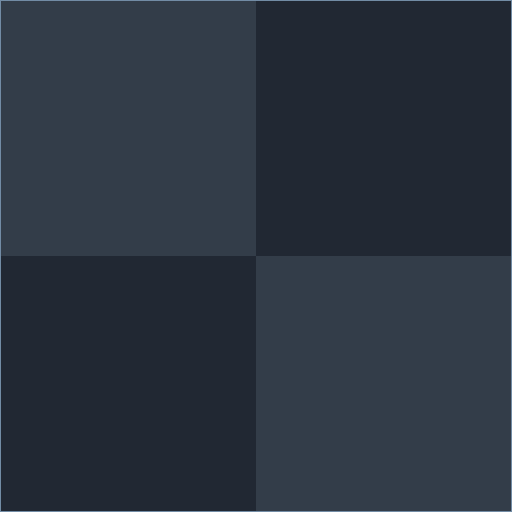

In [23]:
# @title Interactive 3D simulation
VIEW_MODE = "live (Colab)"  # @param ["live (Colab)", "replay"]
REPLAY_PUSH_EVERY_S = 0  # @param {type:"slider", min:0, max:10, step:1}
VIEW_HEIGHT_PX = 560  # @param {type:"slider", min:360, max:900, step:20}

import importlib
import quadbot.sim_viewer as sim_viewer
importlib.reload(sim_viewer)

if globals().get("pretrained") is not None:  # Section 11
    view_policy, view_cfg = pretrained, pre_cfg
elif globals().get("policy") is not None:  # Sections 6-8
    view_policy, view_cfg = policy, env_cfg
else:
    npz_path = "quadbot_policy.npz"
    if IN_COLAB and not os.path.exists(npz_path):
        from google.colab import files
        npz_path = next(name for name in files.upload() if name.endswith(".npz"))
    view_policy, view_cfg = NumpyPolicy(npz_path), QuadBotEnvConfig(command_yaw_range=(-0.6, 0.6))

view_mode = "live" if VIEW_MODE.startswith("live") and sim_viewer.in_colab() else "replay"
print(f"Showing the {view_mode} simulation")
sim_viewer.show_simulation(view_policy, view_cfg, mode=view_mode,
                           push_every=REPLAY_PUSH_EVERY_S, height=VIEW_HEIGHT_PX)